## Power Spectra and Time Frequency Plots

Here, we show:

Power spectra of -500 ms before to 5000ms after hand start relative to power spectra of -1500ms to -500ms before hand start.

We show both overall spectra as well as short time fourier transformed spectra with non-overlapping bins of 500ms.

In [2]:
import matplotlib
from matplotlib import pyplot as plt
from matplotlib import cm
%matplotlib inline
%config InlineBackend.figure_format = 'png' 

import matplotlib.lines as mlines
import seaborn
seaborn.set_style('darkgrid')
matplotlib.rcParams['figure.figsize'] = (12.0, 1.0)
matplotlib.rcParams['font.size'] = 7

In [3]:
import logging
log = logging.getLogger()
log.setLevel("DEBUG")

In [4]:

from scipy.signal import blackmanharris

def amplitudes_and_freqs(inputs, sampling_rate, axis=1, n=None):
    amplitudes = np.abs(np.fft.rfft(inputs, axis=axis, n=n))
    n_samples = n
    if n_samples is None:
        n_samples = inputs.shape[axis]
    freq_bins = np.fft.rfftfreq(n_samples, d=1.0/sampling_rate)
    return amplitudes, freq_bins

def bps_and_freqs(inputs, sampling_rate, axis=1, n=None):
    if n is None:
        n = inputs.shape[axis]
    amplitudes, freqs  = amplitudes_and_freqs(inputs, sampling_rate, axis, n)
    return (amplitudes * amplitudes) / n, freqs
    
def multiply_blackmann_harris_window(inputs, axis=1):
    n = inputs.shape[axis]
    w = blackmanharris(n)
    #w=w/np.mean(w)
    # make w have same dimensionality as inputs,
    # to ensure correct dimensions are multiplied
    for i_axis in xrange(inputs.ndim):
        if i_axis != axis:
            w = np.expand_dims(w, i_axis)
    return w * inputs
    
def windowed_bps_and_freqs(inputs, sampling_rate, axis=1, n=None):
    inputs = multiply_blackmann_harris_window(inputs, axis=axis)
    return bps_and_freqs(inputs, sampling_rate, axis, n)

In [5]:
def extract_windows(cnt,y,i_class, start_offset, stop_offset):#
    # get actual event sample indices for that class
    # first find the increases in the y value (start of event window)
    # then add 75 to get middle of window => actual event
    class_inds = np.flatnonzero(y[1:,i_class] - y[:-1,i_class] == 1) + 75 + 1
    # ignore first event as it may cause boundary problems in data
    all_windows = np.array([cnt[i + start_offset:i+stop_offset] for i in class_inds[1:]])
    return all_windows


## Load data

In [136]:
from braindecode.datasets.grasp_lift import AllSubjectsKaggleGraspLiftSet

all_set = AllSubjectsKaggleGraspLiftSet(data_folder='data/kaggle-grasp-lift/', 
                                        resample_half=False,standardize=False)

all_set.load()

INFO:braindecode.datasets.grasp_lift:Loading Subject 1...
INFO:braindecode.datasets.grasp_lift:Loading data...
INFO:braindecode.datasets.grasp_lift:..Done.
INFO:braindecode.datasets.grasp_lift:Loading Subject 2...
INFO:braindecode.datasets.grasp_lift:Loading data...
INFO:braindecode.datasets.grasp_lift:..Done.
INFO:braindecode.datasets.grasp_lift:Loading Subject 3...
INFO:braindecode.datasets.grasp_lift:Loading data...
INFO:braindecode.datasets.grasp_lift:..Done.
INFO:braindecode.datasets.grasp_lift:Loading Subject 4...
INFO:braindecode.datasets.grasp_lift:Loading data...
INFO:braindecode.datasets.grasp_lift:..Done.
INFO:braindecode.datasets.grasp_lift:Loading Subject 5...
INFO:braindecode.datasets.grasp_lift:Loading data...
INFO:braindecode.datasets.grasp_lift:..Done.
INFO:braindecode.datasets.grasp_lift:Loading Subject 6...
INFO:braindecode.datasets.grasp_lift:Loading data...
INFO:braindecode.datasets.grasp_lift:..Done.
INFO:braindecode.datasets.grasp_lift:Loading Subject 7...
INFO:b

## Extract baseline and trial windows

In [137]:
import numpy as np
all_subjects_trials = []
all_subjects_baselines = []
for single_subject_set in all_set.kaggle_sets:
    i_class = 0
    start_offset = -250
    stop_offset = 2500
    series_trials = [extract_windows(cnt,y,i_class,start_offset,stop_offset) for cnt,y in zip(
            single_subject_set.train_X_series, single_subject_set.train_y_series)]
    # use all series
    all_trials =  np.concatenate(series_trials)
    
    start_offset = -750
    stop_offset = -250
    series_baselines = [extract_windows(cnt,y,i_class,start_offset,stop_offset) for cnt,y in zip(
            single_subject_set.train_X_series, single_subject_set.train_y_series)]
    # use all series
    all_baselines =  np.concatenate(series_baselines)
    all_subjects_trials.append(all_trials)
    all_subjects_baselines.append(all_baselines)
    
    

## Power spectra over complete trial

We compute bandpower of given input like this:

* multiply input with blackmann harris window
* compute FFT
* take absolute values
* square
* divide by window length

We upsample the meaned baseline bandpower to have the same frequency resolution as the trial fft (they have 1000 and 3000 input samples respectively) by linear interpolation.

We then compute relative bandpower by dividing trial bandpower by the meaned upsampled baseline bandpower (and taking the logarithm).

We plot the mean over all channels and the individual channels.

In [138]:
from scipy.interpolate import interp1d

all_subjects_bps_baseline = []
all_subjects_bps_trials = []
freqs_trials = None
for subject_trials, subject_baselines in zip(all_subjects_trials, all_subjects_baselines):

    bps_trials, freqs_trials = windowed_bps_and_freqs(subject_trials,sampling_rate=500.0,axis=1)
    bps_baseline, freqs_baseline = windowed_bps_and_freqs(subject_baselines, sampling_rate=500.0, axis=1) 

    # Enlarge baseline to have same number of frequency bins as trial power spectrum
    # interpolate inbetween points linearly to get same resolution as trials spectrum
    enlarged_baseline = np.ones(bps_trials.shape[1:]) * np.nan
    for i_chan in xrange(bps_baseline.shape[2]):
        # mean bp baseline across baselines/trials
        meaned_bp_baseline = np.mean(bps_baseline[:,:,i_chan], axis=0)
        interp_fn = interp1d(freqs_baseline, meaned_bp_baseline)
        interpolated_bp = interp_fn(freqs_trials)
        enlarged_baseline[:,i_chan] = interpolated_bp
    assert not np.any(np.isnan(enlarged_baseline))



    enlarged_baseline = enlarged_baseline[np.newaxis, :,:]
    all_subjects_bps_trials.append(bps_trials)
    all_subjects_bps_baseline.append(enlarged_baseline)

In [139]:
import scikits.samplerate

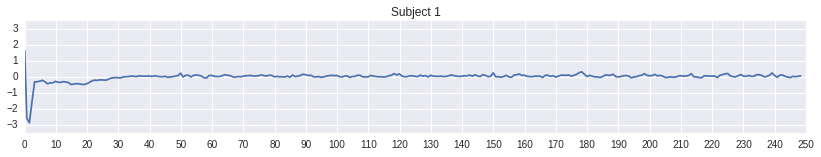

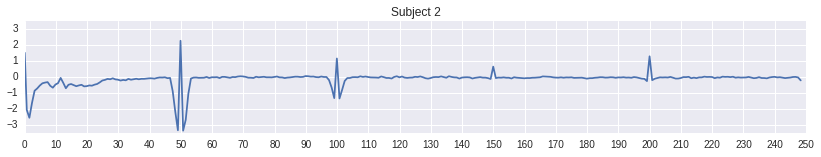

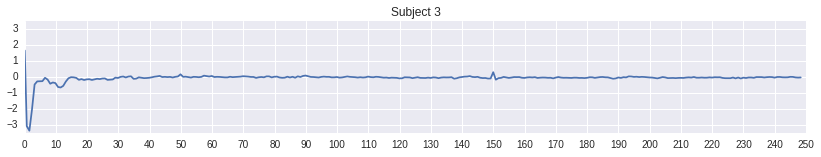

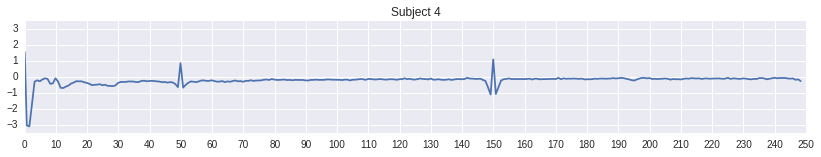

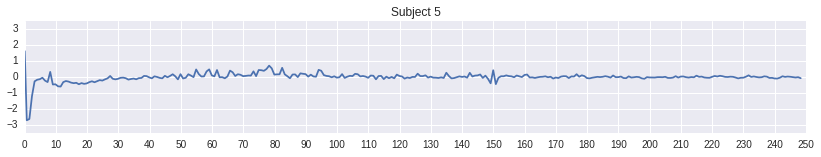

...

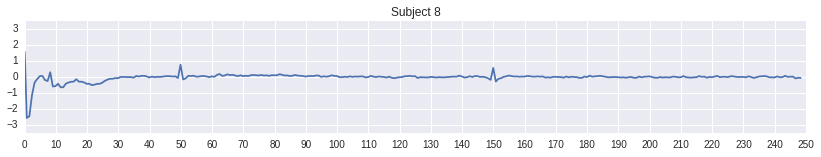

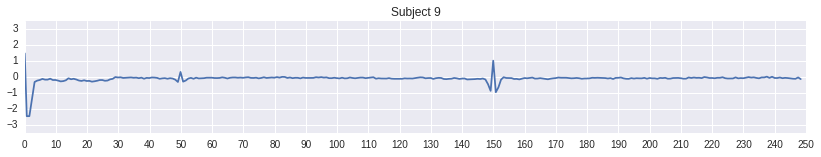

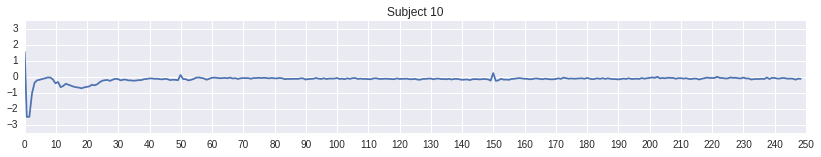

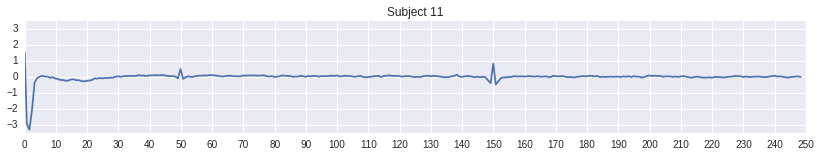

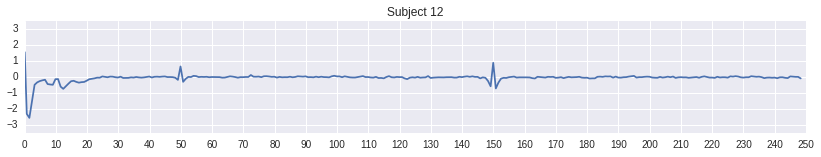

In [155]:
for i_subject in xrange(12):
    subject_bp_trial = all_subjects_bps_trials[i_subject]
    subject_bp_baseline = all_subjects_bps_baseline[i_subject]
    bp_divided_trials = (subject_bp_trial / subject_bp_baseline)
    bp_divided_trials = np.log(np.mean(bp_divided_trials, axis=(0,2)))
    freqs_plot = scikits.samplerate.resample(freqs_trials,
        300.0 / len(freqs_trials), 'linear')
    bp_divided_trials = scikits.samplerate.resample(bp_divided_trials,
        300.0 / len(bp_divided_trials), 'linear')
    plt.figure(figsize=(14,2))
    plt.plot(freqs_plot, bp_divided_trials)
    plt.title("Subject {:d}".format(i_subject + 1))
    plt.ylim(-3.5,3.5)
    plt.xticks(np.arange(0,251,10))
    None

## Topographies

For the topographies, we downsample by first smoothing the input (moving average over 5 samples) and then subsampling by factor 5.

In [142]:
def resample_for_plot(arr, n_samples, sampling_type, axis=None):
    arr = np.array(arr)
    if axis is None and arr.ndim == 1:
        axis = 0
    if axis is None and arr.ndim == 2:
        axis = 0
    if axis is None and arr.ndim > 2:
        raise ValueError("Not implemented yet")
    if axis > 1:
        raise ValueError("Not implemented yet")
    ratio = float(n_samples) / float(arr.shape[axis])
    if axis == 0:
        return scikits.samplerate.resample(arr, ratio, sampling_type)
    else:
        assert axis == 1 and arr.ndim == 2, "Nothing else implemented yet" 
        return scikits.resample(arr.T, ratio, sampling_type).T

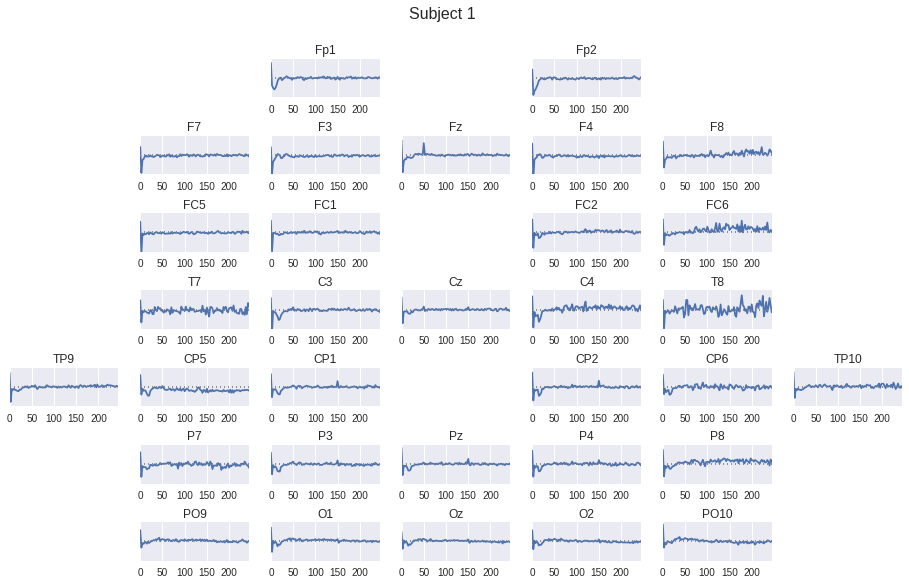

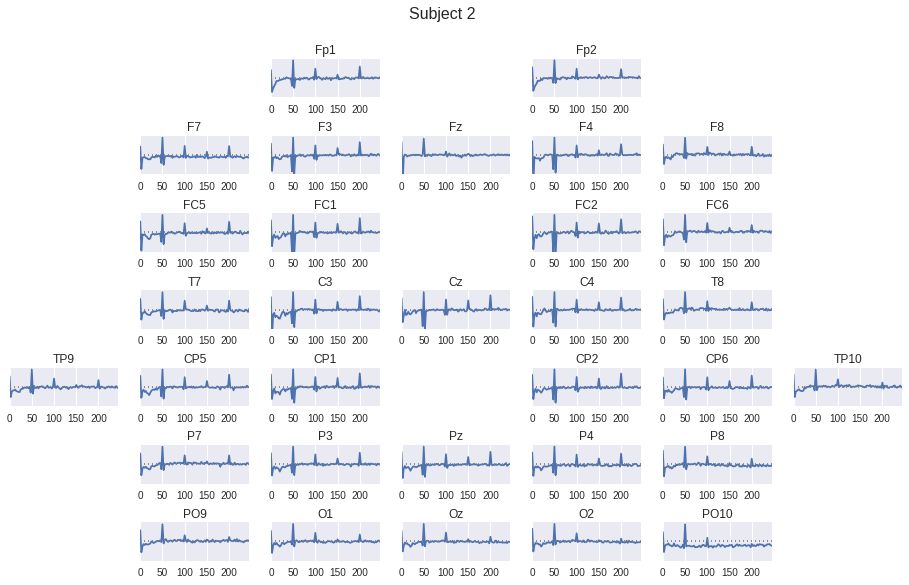

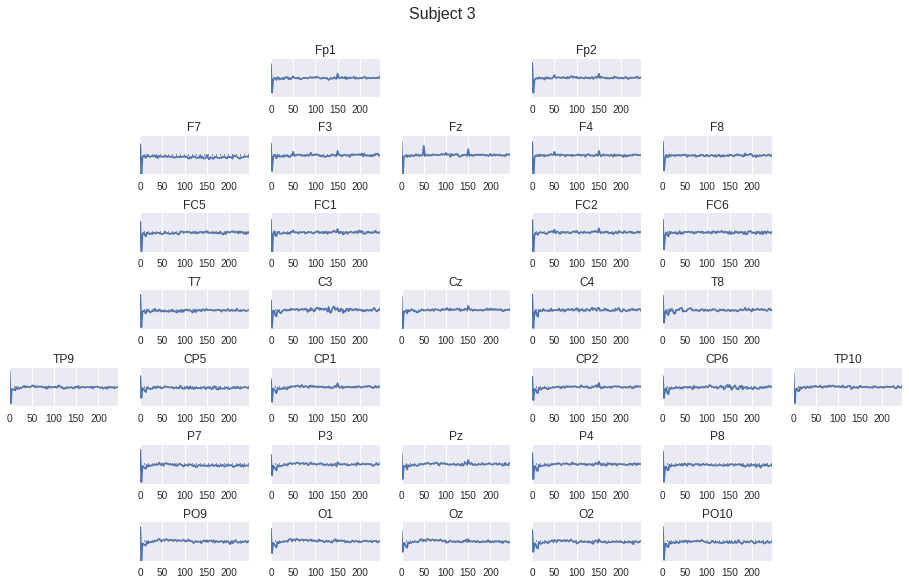

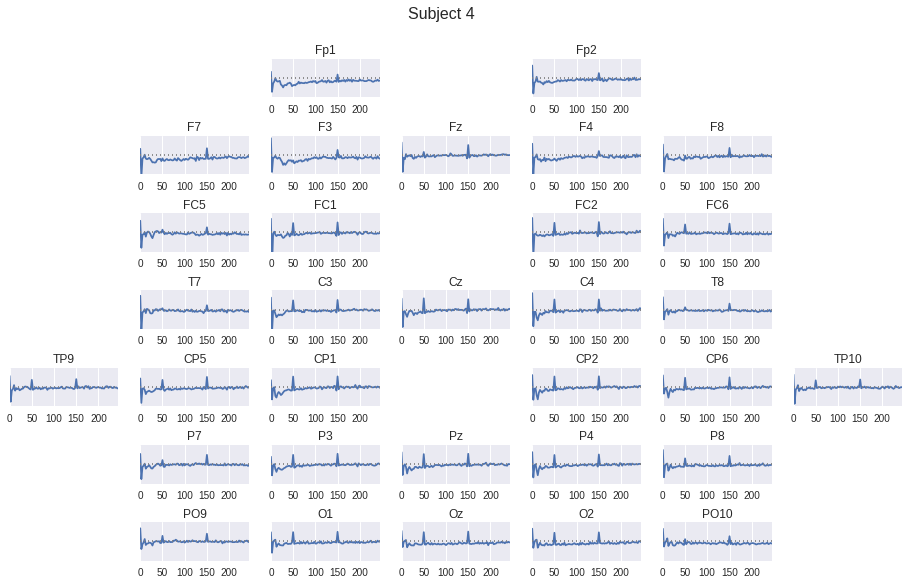

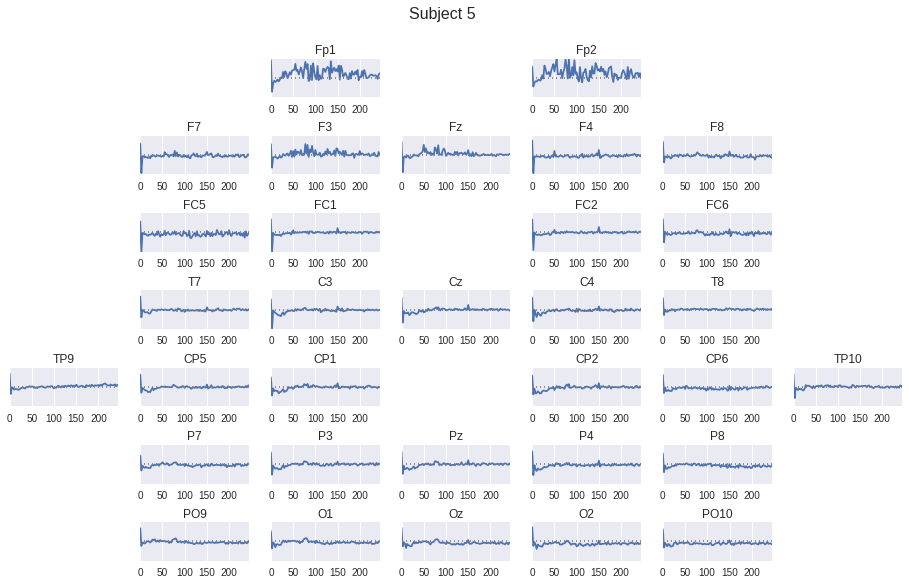

...

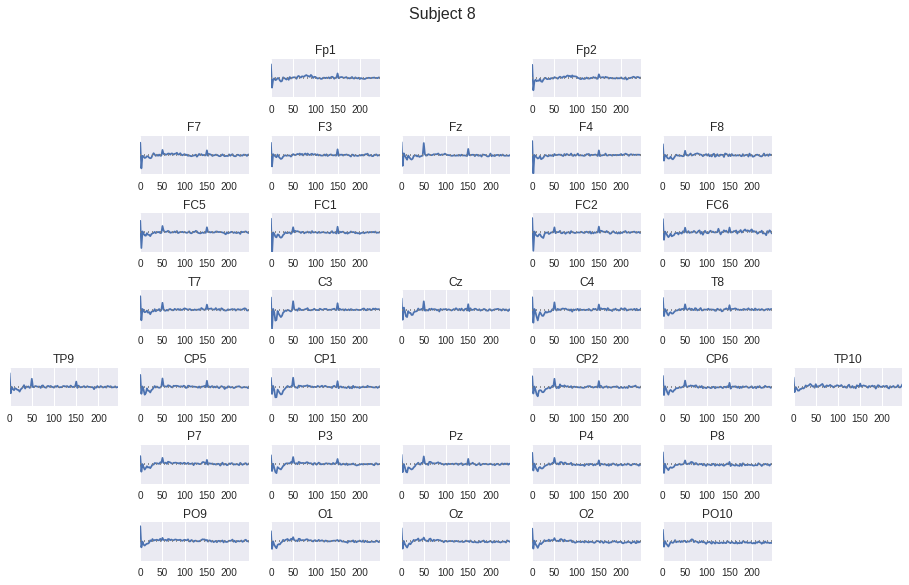

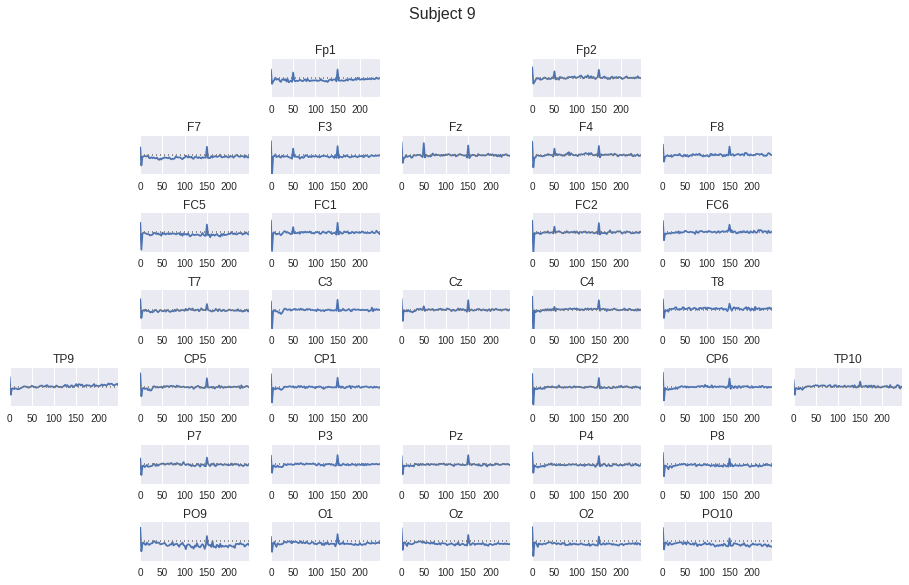

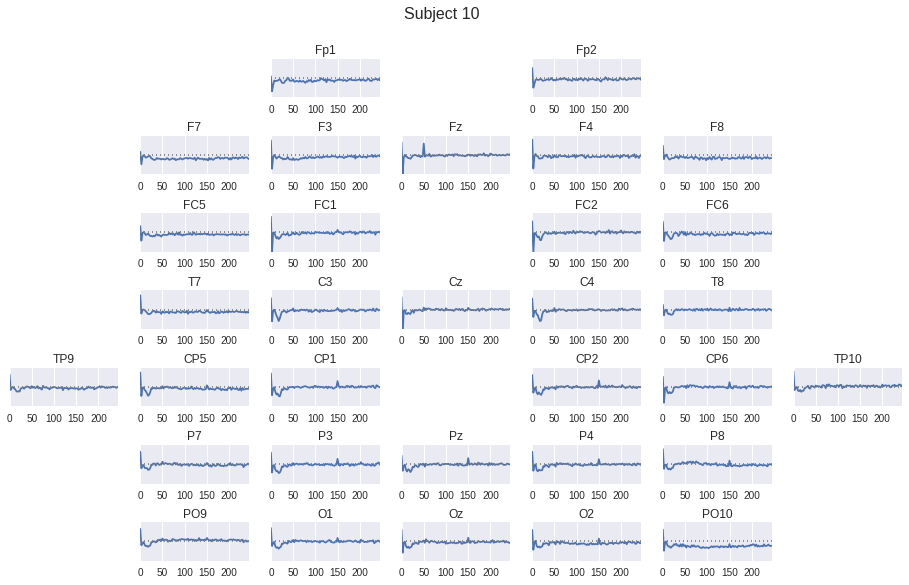

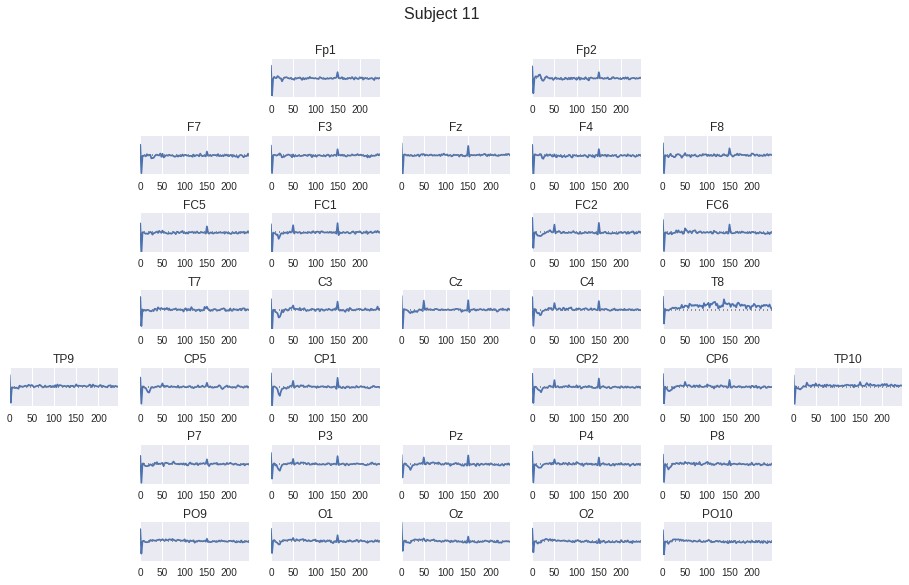

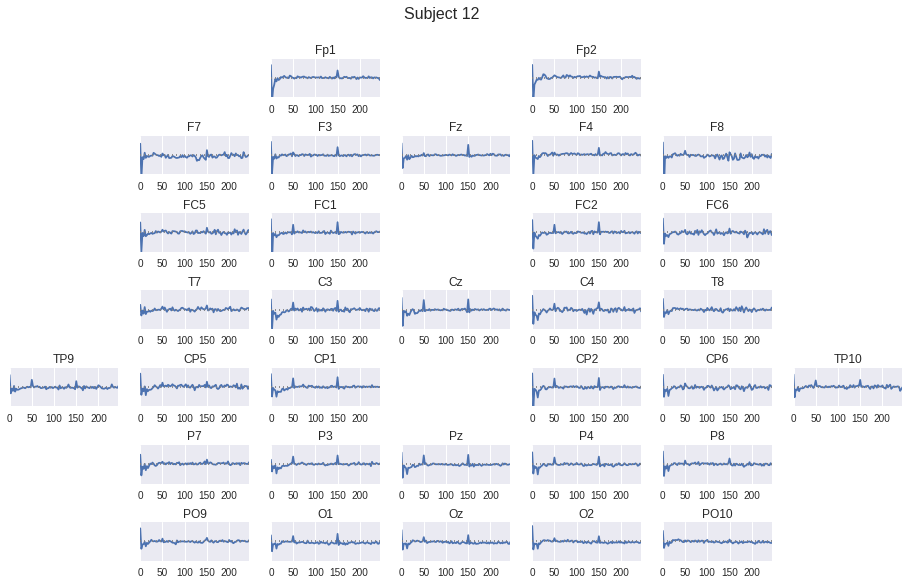

In [144]:
from braindecode.analysis.plot_util import plot_head_signals_tight
from braindecode.datasets.sensor_positions import tight_Kaggle_positions
for i_subject in xrange(len(all_subjects_baselines)):
    subject_bp_trial = all_subjects_bps_trials[i_subject]
    subject_bp_baseline = all_subjects_bps_baseline[i_subject]
    bp_divided_trials = (subject_bp_trial / subject_bp_baseline)
    relative_bp = np.log(np.mean(bp_divided_trials, axis=0))
    # Subsample bps 
    
    subsampled_bps = resample_for_plot(relative_bp, 100, 'linear').T
    freqs_plot = resample_for_plot(freqs_trials, 100, 'linear')
    fig = plot_head_signals_tight(subsampled_bps, all_set.kaggle_sets[0].sensor_names,
                           sensor_map=tight_Kaggle_positions, figsize=(16,9))
    plt.ylim(-2.5,2.5)
    plt.xticks(np.arange(0,len(freqs_plot) + 1,20), [int(round(f)) for f in freqs_plot[::20]])
    plt.subplots_adjust(hspace=1.0)
    fig.suptitle("Subject {:d}".format(i_subject + 1), fontsize=16, y=0.98)
    None

## Short term fourier transform

X axis is in seconds relative to hand start, y axis is Hz.

Values go from blue (negative) over grey (zero) to red (positive).

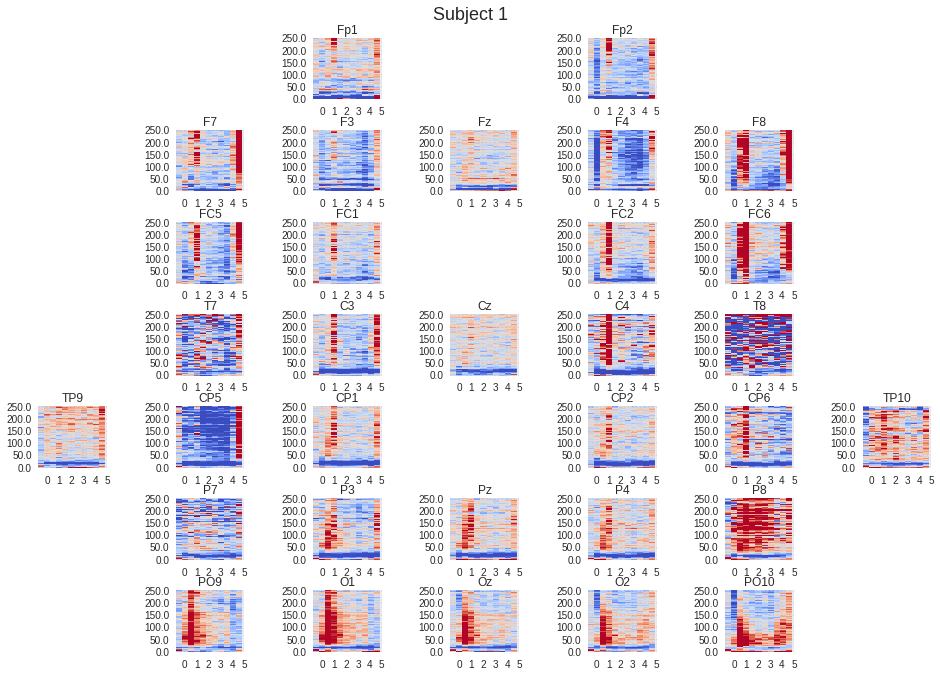

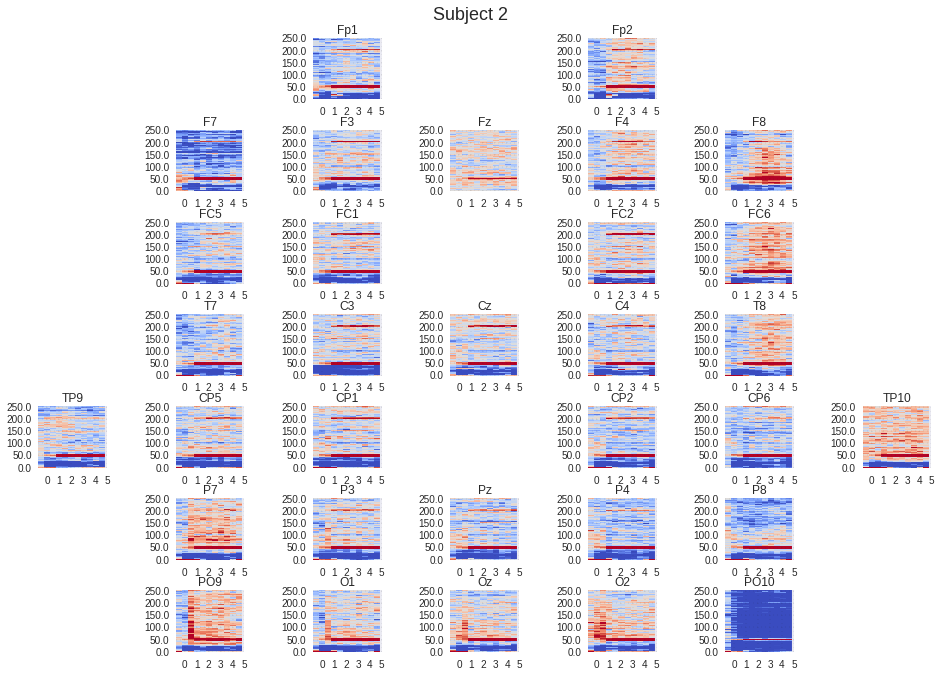

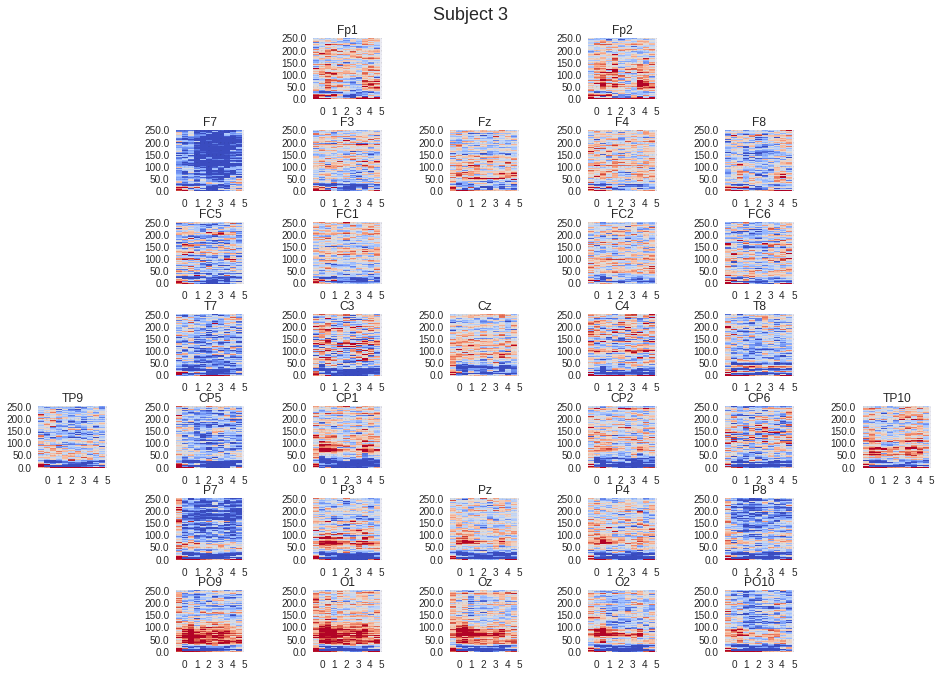

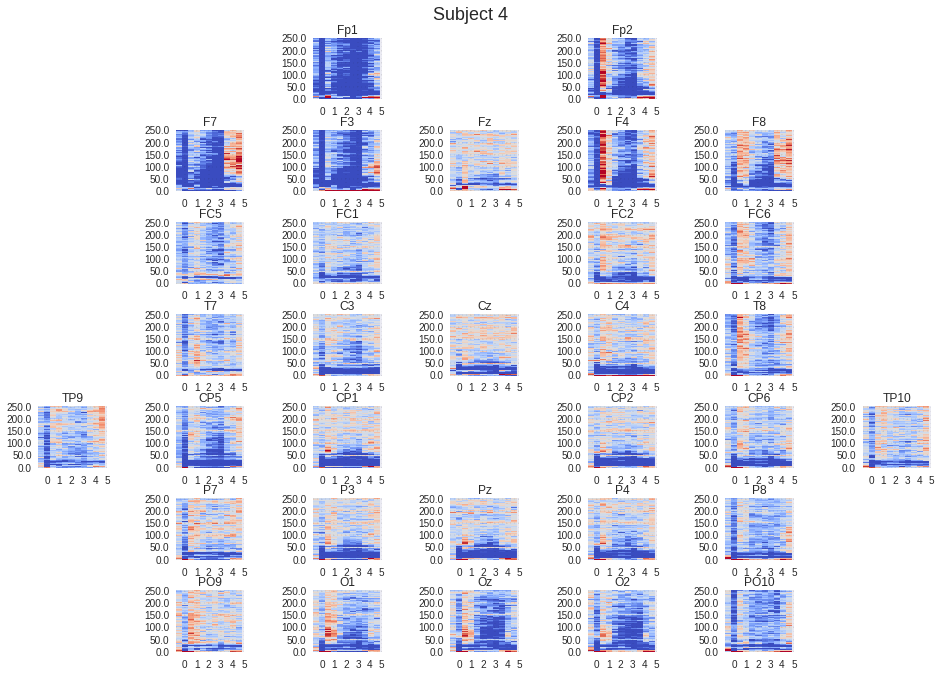

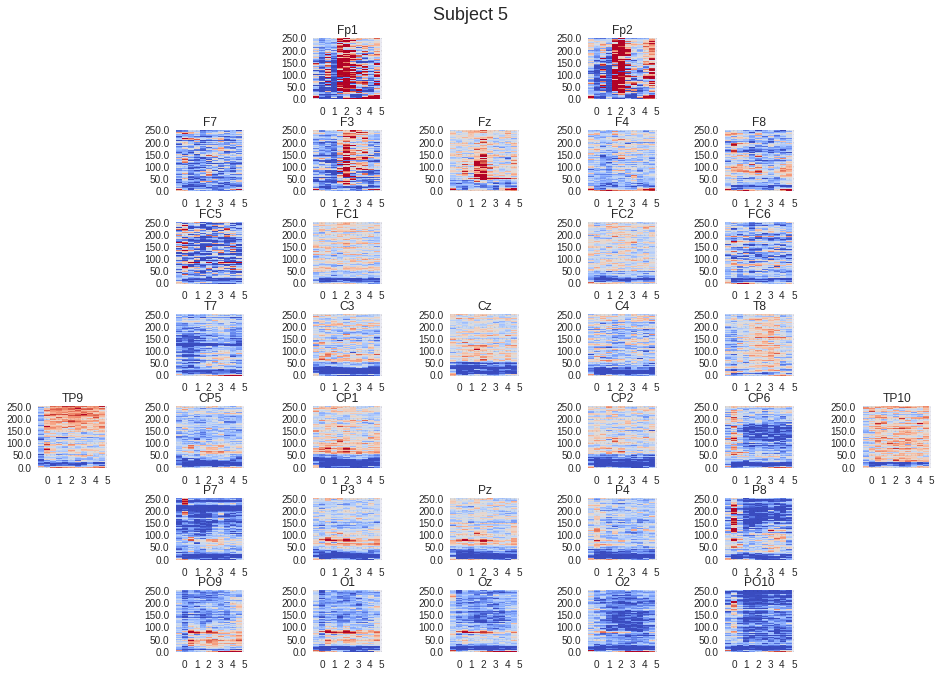

...

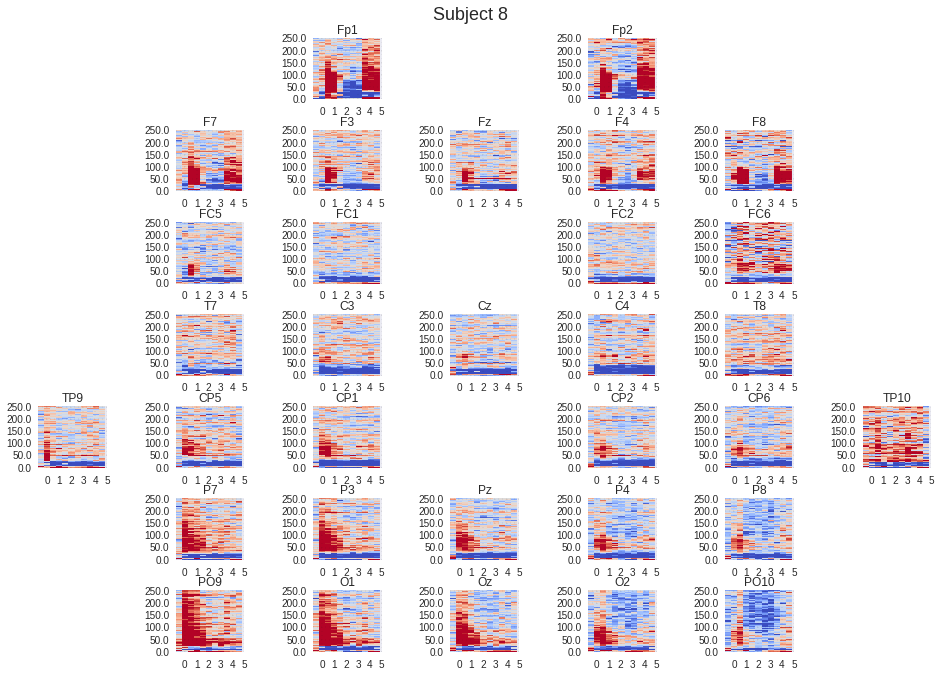

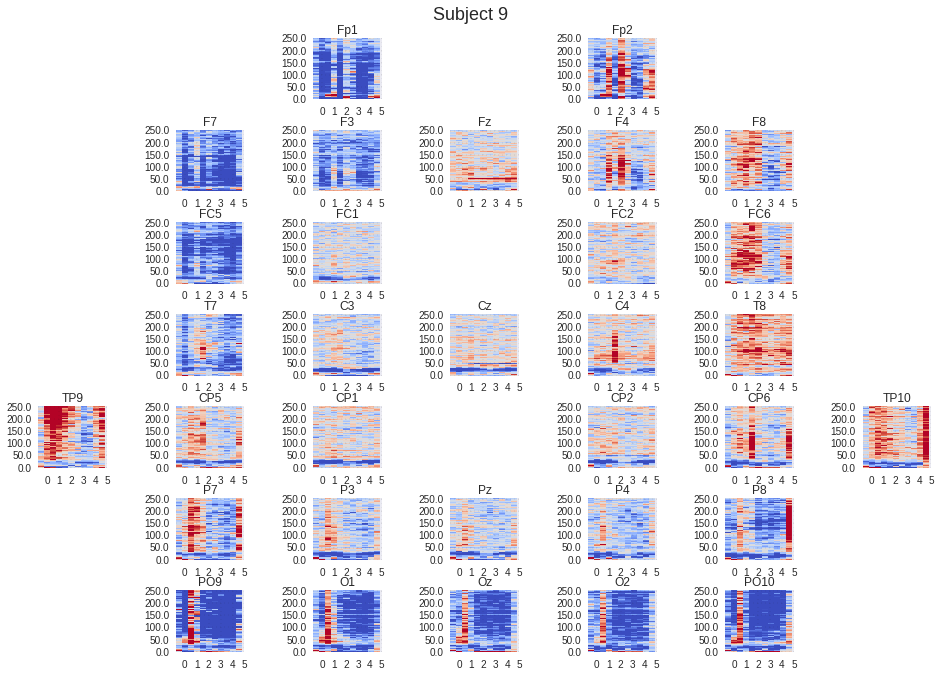

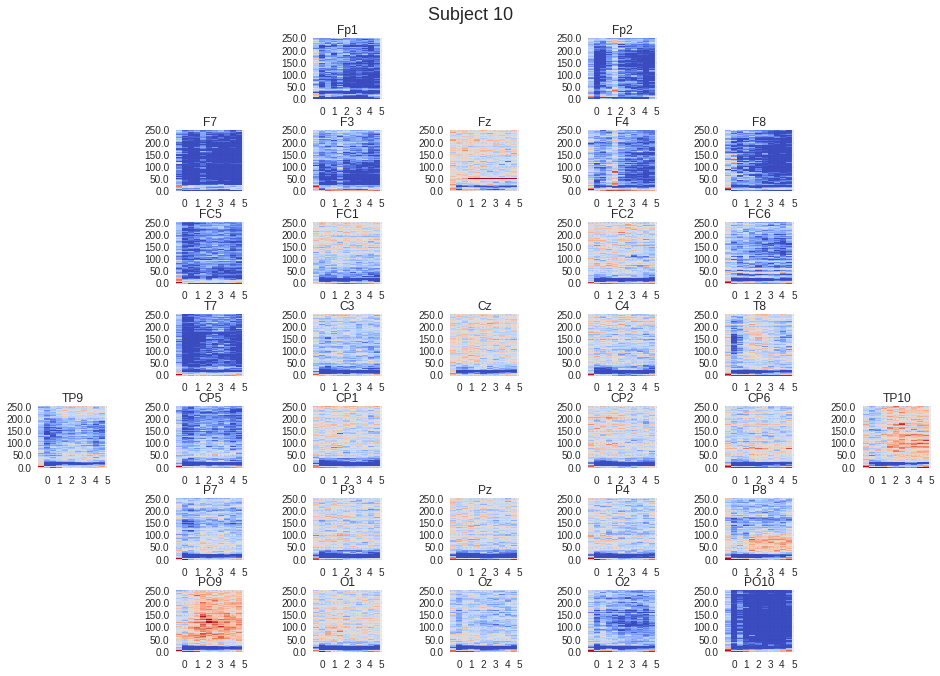

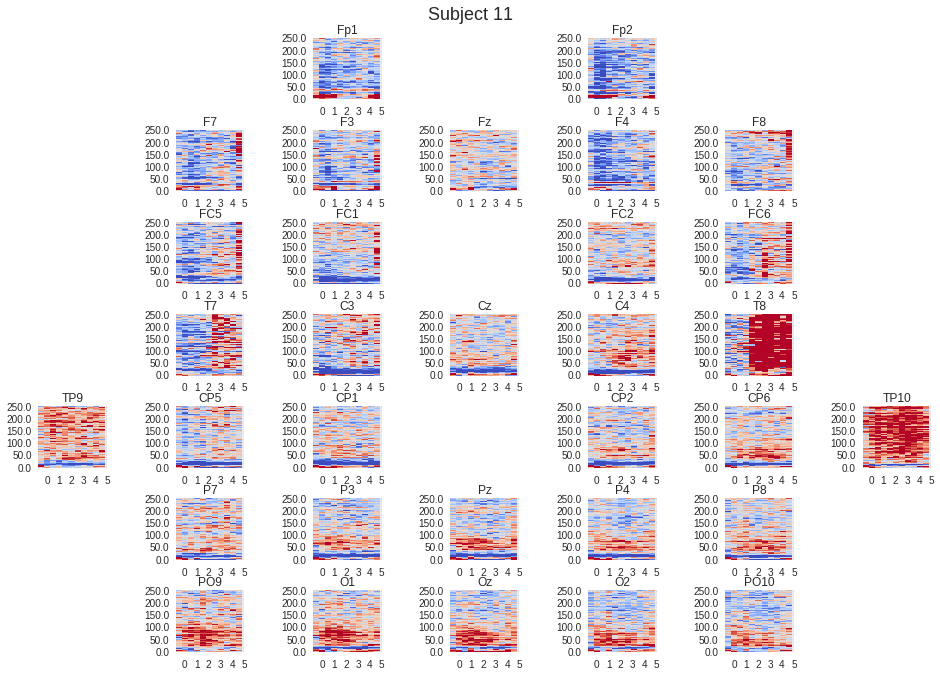

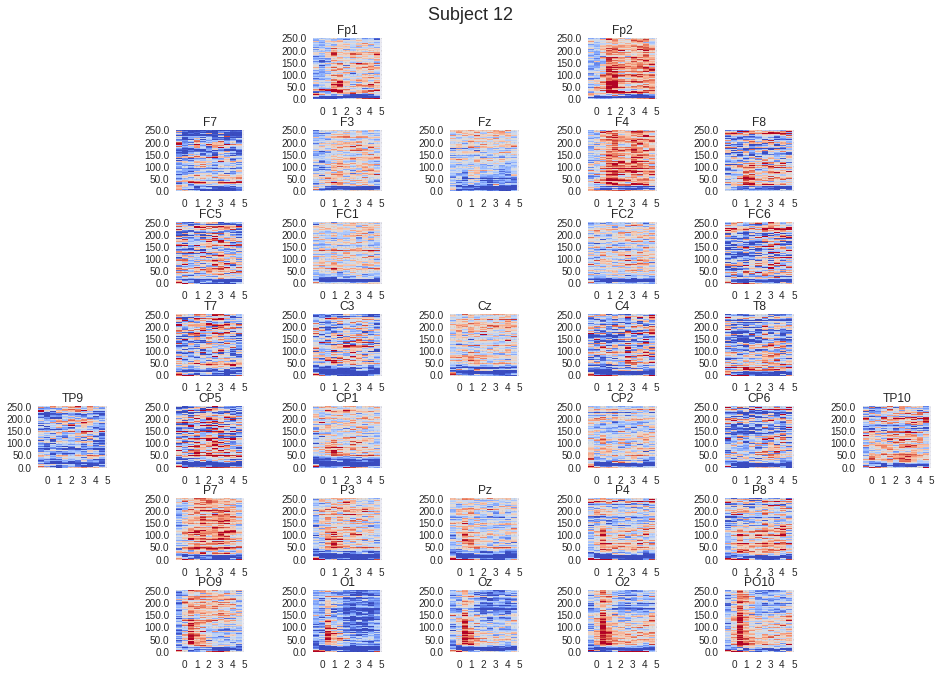

In [153]:
from braindecode.analysis.plot_util import plot_chan_matrices

for i_subject in xrange(len(all_subjects_baselines)):
    baselines = all_subjects_baselines[i_subject]
    baseline_bins = [baselines[:,start:start+250] for start in [0,250]]
    baseline_bins = np.array(baseline_bins)
    bps_baseline_bins, freq_bins  = windowed_bps_and_freqs(baseline_bins,sampling_rate=500.0,axis=2)
    bp_chan_baseline_bins = np.mean(bps_baseline_bins, axis=(0,1))
    trials = all_subjects_trials[i_subject]
    trial_bins = [trials[:,start:start+250] for start in range(0,2501,250)]
    trial_bins = np.array(trial_bins)
    bps_trial_bins, freq_bins  = windowed_bps_and_freqs(trial_bins,sampling_rate=500.0,axis=2)
    relative_bp_bins = np.log(np.mean(bps_trial_bins / bp_chan_baseline_bins, axis=1))
    fig = plot_chan_matrices(relative_bp_bins.transpose(2,0,1),all_set.kaggle_sets[0].sensor_names,
                      sensor_map=tight_Kaggle_positions,figsize=(16,11))
    plt.subplots_adjust(hspace=0.5, wspace=1.)
    for ax in fig.axes:
        ax.set_xticks([1.5,3.5,5.5,7.5,9.5,11.5])
        ax.set_xticklabels([0,1,2,3,4,5])
        ax.tick_params(axis='both', which='major', labelsize=10)
    fig.suptitle("Subject {:d}".format(i_subject+1), fontsize=18, y=0.94)
    None

## Time Domain Signals

In [43]:
# Standardize and recompute trials

all_set.standardize_train_data()

import numpy as np
all_subjects_trials = []
for single_subject_set in all_set.kaggle_sets:
    i_class = 0
    start_offset = -250
    stop_offset = 2500
    series_trials = [extract_windows(cnt,y,i_class,start_offset,stop_offset) for cnt,y in zip(
            single_subject_set.train_X_series, single_subject_set.train_y_series)]
    # use all series
    all_trials =  np.concatenate(series_trials)
    
    all_subjects_trials.append(all_trials)
    

INFO:braindecode.datasets.grasp_lift:Standardizing Train Subject 1...
INFO:braindecode.datasets.grasp_lift:Standardizing Train Subject 2...
INFO:braindecode.datasets.grasp_lift:Standardizing Train Subject 3...
INFO:braindecode.datasets.grasp_lift:Standardizing Train Subject 4...
INFO:braindecode.datasets.grasp_lift:Standardizing Train Subject 5...
INFO:braindecode.datasets.grasp_lift:Standardizing Train Subject 6...
INFO:braindecode.datasets.grasp_lift:Standardizing Train Subject 7...
INFO:braindecode.datasets.grasp_lift:Standardizing Train Subject 8...
INFO:braindecode.datasets.grasp_lift:Standardizing Train Subject 9...
INFO:braindecode.datasets.grasp_lift:Standardizing Train Subject 10...
INFO:braindecode.datasets.grasp_lift:Standardizing Train Subject 11...
INFO:braindecode.datasets.grasp_lift:Standardizing Train Subject 12...


## All classes, meaned across all trials and subjects 

Note especially for class 2 /first digit touch and class 6/both release, the apparently phase-locked 50 Hz response(!)

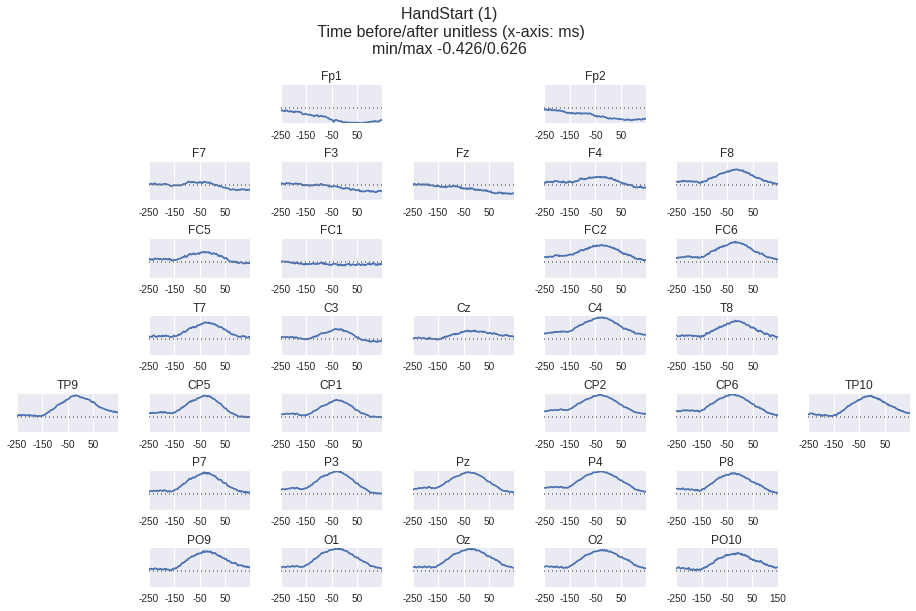

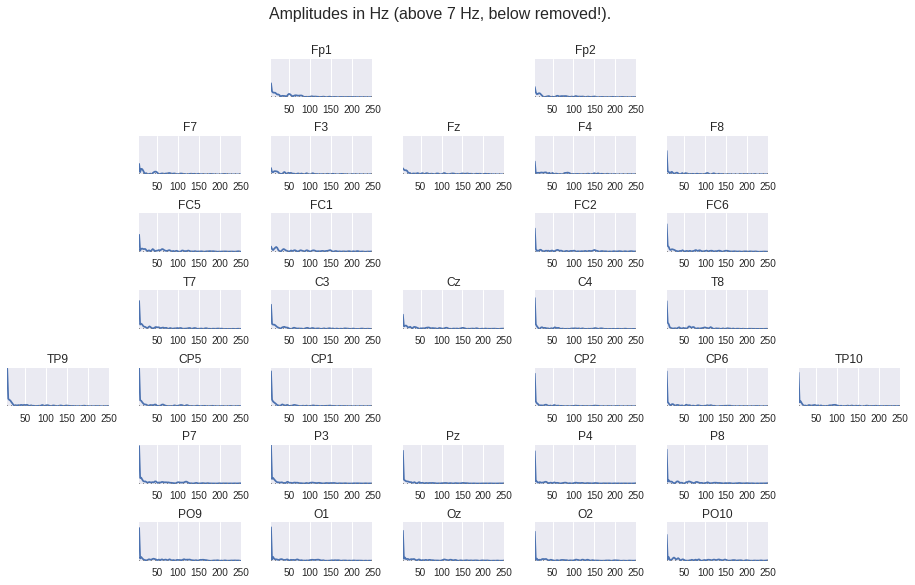

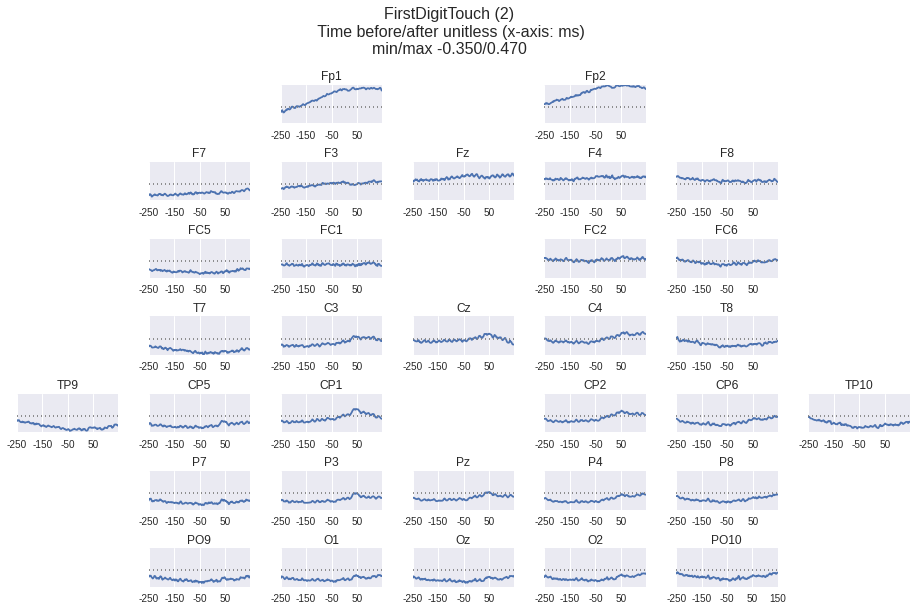

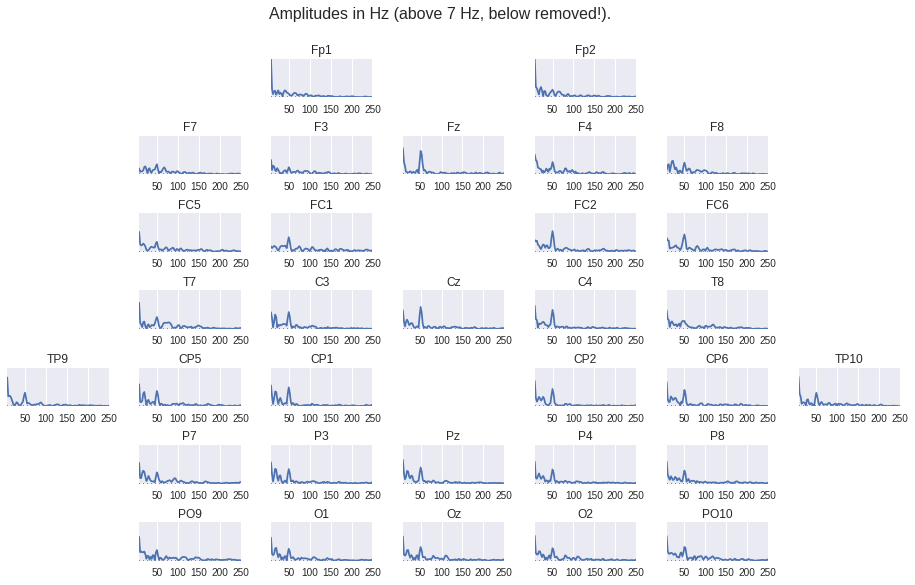

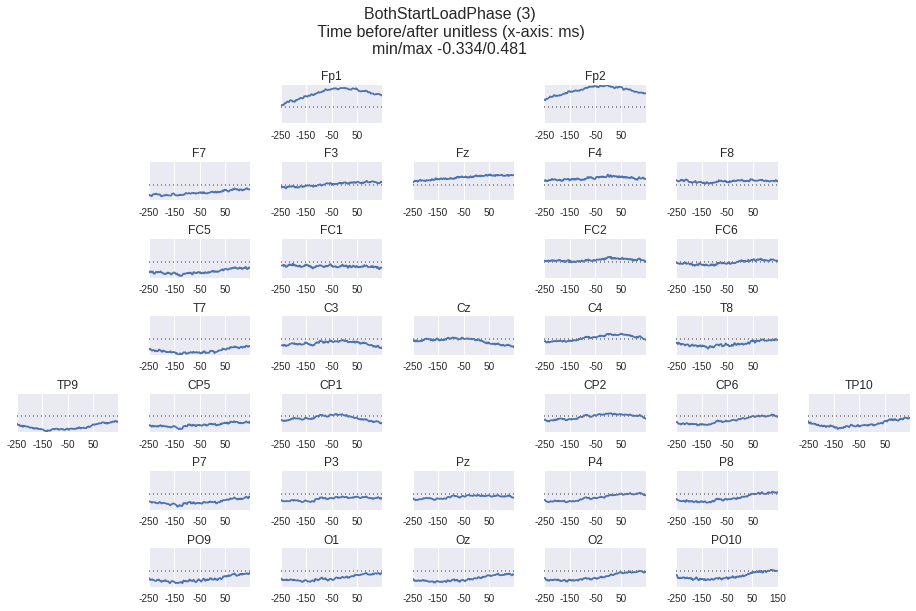

...

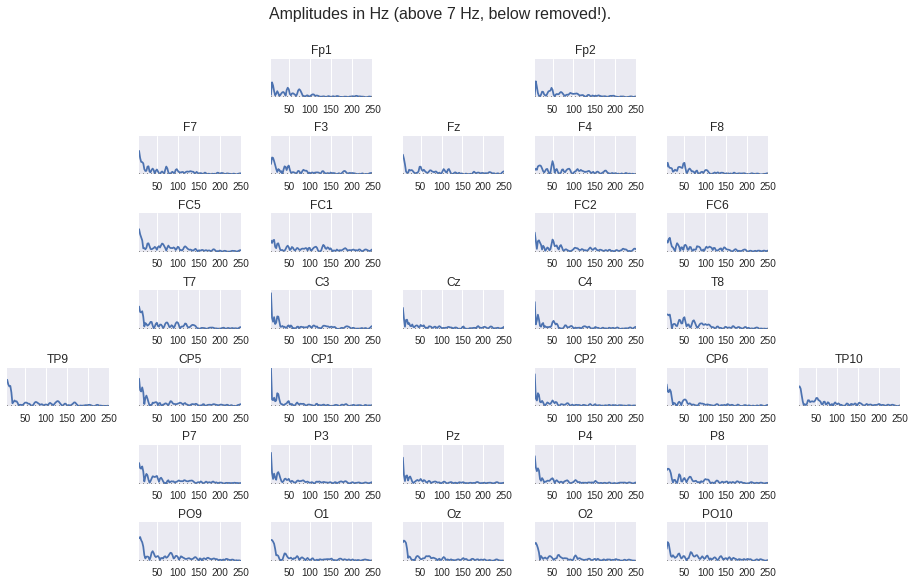

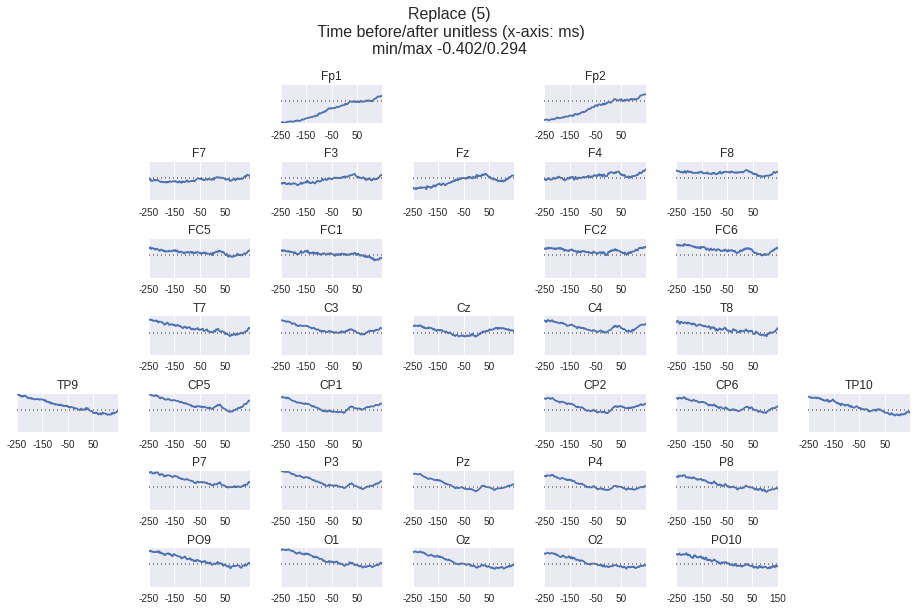

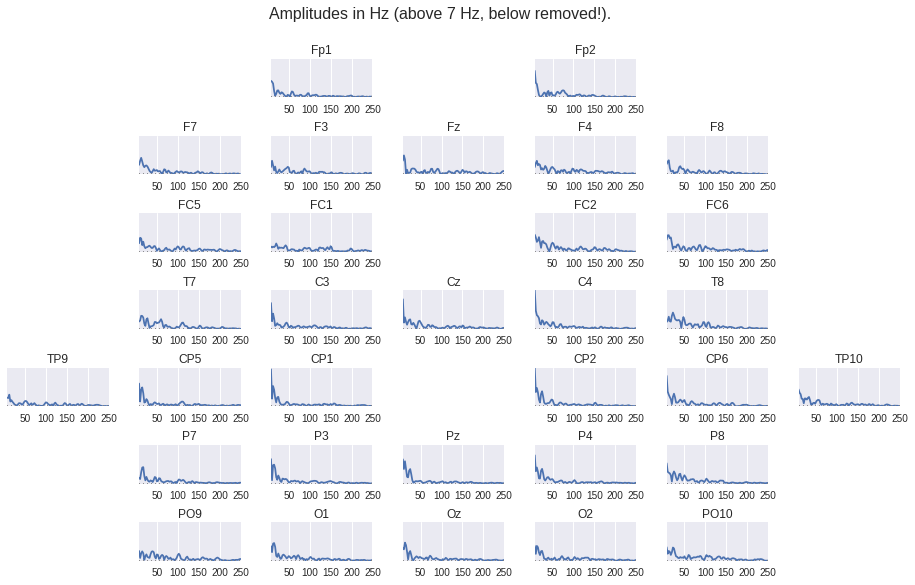

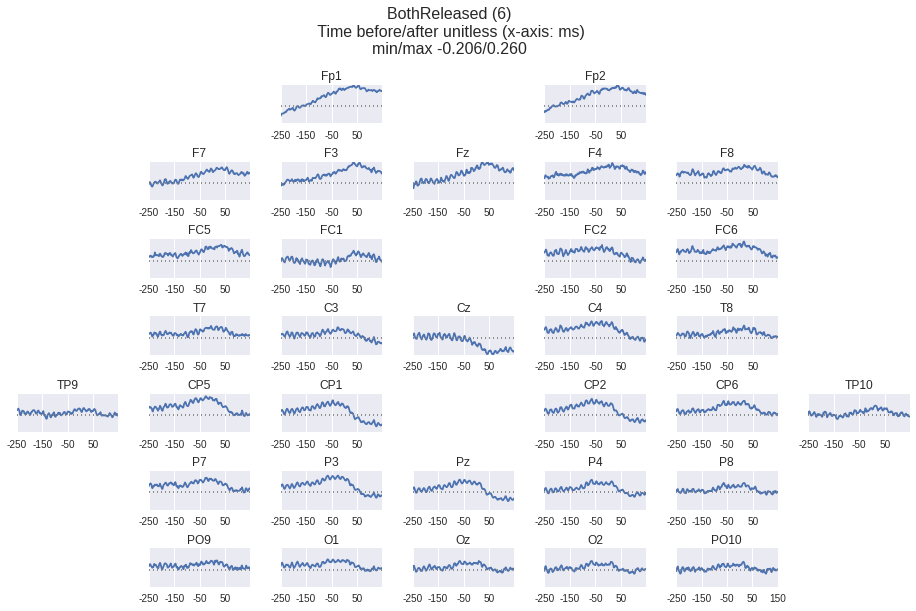

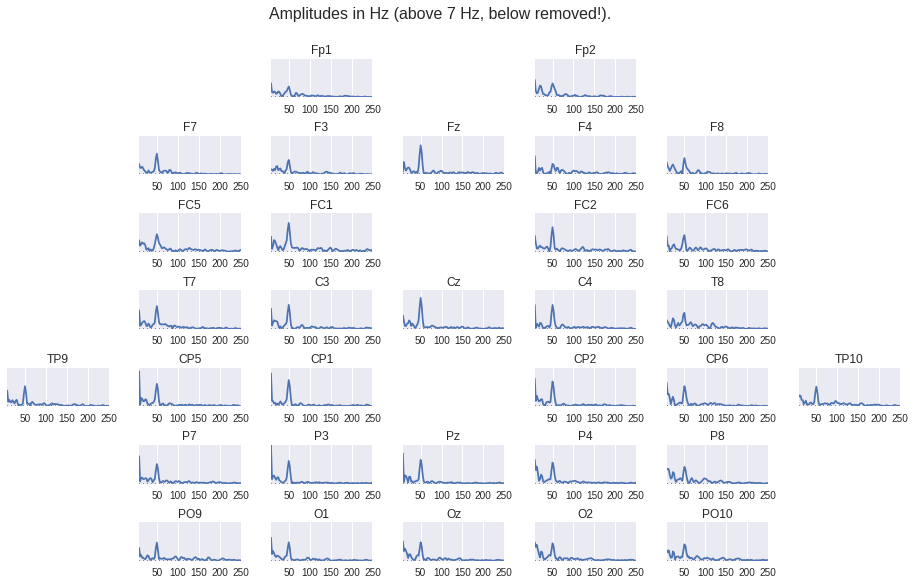

In [121]:

class_names = ['HandStart', 'FirstDigitTouch', 'BothStartLoadPhase',
    'LiftOff', 'Replace', 'BothReleased']

for i_class in range(6):
    all_class_trials = []
    for i_subject in xrange(12):
        train_topo = np.concatenate(all_set.kaggle_sets[i_subject].train_X_series)
        train_y = np.concatenate(all_set.kaggle_sets[i_subject].train_y_series)
        class_trials = extract_windows(train_topo,
                                               train_y,
                                               i_class, -125,75)
        all_class_trials.append(class_trials)
    merged_trials = np.concatenate(all_class_trials)
    mean_trials = np.mean(merged_trials, axis=0)
    fig = plot_head_signals_tight(mean_trials.T, 
                all_set.kaggle_sets[i_subject].sensor_names,
               sensor_map=tight_Kaggle_positions,
                figsize=(16,9))#tsplot did not show much uncertainty...therefore just showing mean

    plt.xticks(range(0,201,50), range(-250,151,100))
    plt.subplots_adjust(hspace=1.0)
    plt.subplots_adjust(wspace=0.3)
    fig.suptitle("{:s} ({:d}) \n Time before/after unitless (x-axis: ms)\nmin/max {:.3f}/{:.3f}".format(
            class_names[i_class], i_class+1, plt.ylim()[0], plt.ylim()[1]),fontsize=16, y=1.02)
    #fig.axes[0].set_yticks(plt.ylim())
    
    merged_bps, merged_freqs = windowed_bps_and_freqs(mean_trials, sampling_rate=500.0, axis=0)
    fig = plot_head_signals_tight(np.sqrt(merged_bps).T[:,3:], 
            all_set.kaggle_sets[i_subject].sensor_names,
           sensor_map=tight_Kaggle_positions,
            figsize=(16,9))#tsplot did not show much uncertainty...therefore just showing mean

    plt.xticks(range(20-3,len(merged_freqs)- 3,20), [int(round(f)) for f in merged_freqs[20::20]])
    plt.subplots_adjust(hspace=1.0)
    plt.subplots_adjust(wspace=0.3)
    fig.suptitle("Amplitudes in Hz (above 7 Hz, below removed!).", fontsize=16, y=0.98)

## Whole trials, meaned across all subjects

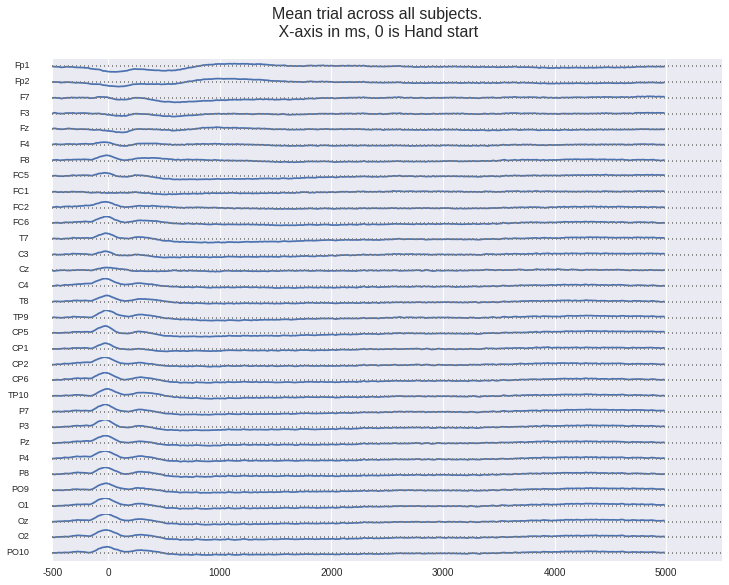

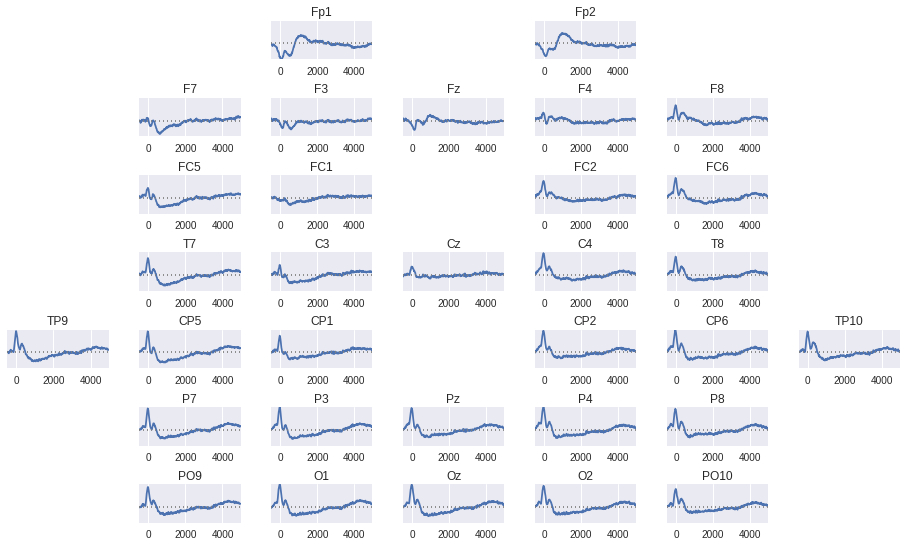

In [134]:
mean_trial_across_all_subjects = np.mean(np.concatenate(all_subjects_trials), axis=0)

plot_trial = resample_for_plot(mean_trial_across_all_subjects, 550, 'sinc_fastest')
fig = plot_sensor_signals(plot_trial.T, all_set.kaggle_sets[i_subject].sensor_names, figsize=(12,9))
plt.xticks([0] + range(50,551,100), [-500] + range(0,5001,1000))

fig.suptitle("Mean trial across all subjects.\n X-axis in ms, 0 is Hand start".format(
        i_subject + 1), fontsize=16, y=0.98)
fig = plot_head_signals_tight(plot_trial.T, 
            all_set.kaggle_sets[i_subject].sensor_names,
           sensor_map=tight_Kaggle_positions,
            figsize=(16,9))
plt.xticks(range(50,551,200), range(0,5001,2000))
plt.subplots_adjust(hspace=1.0)
plt.subplots_adjust(wspace=0.3)
None

## Individual Subjects

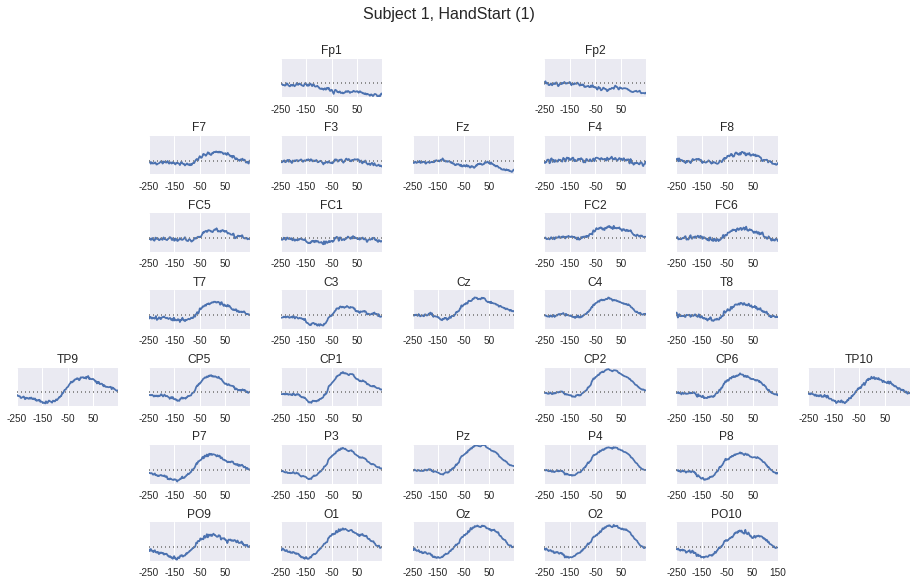

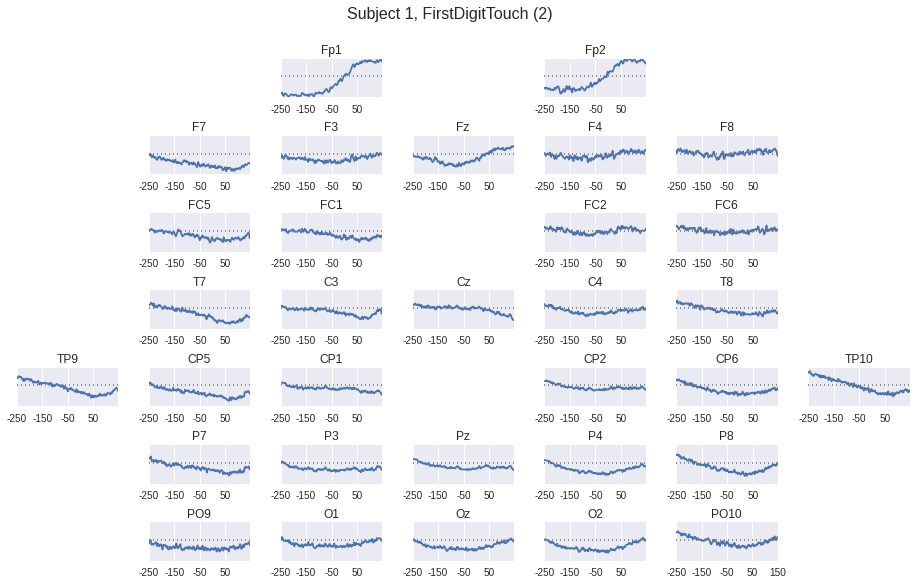

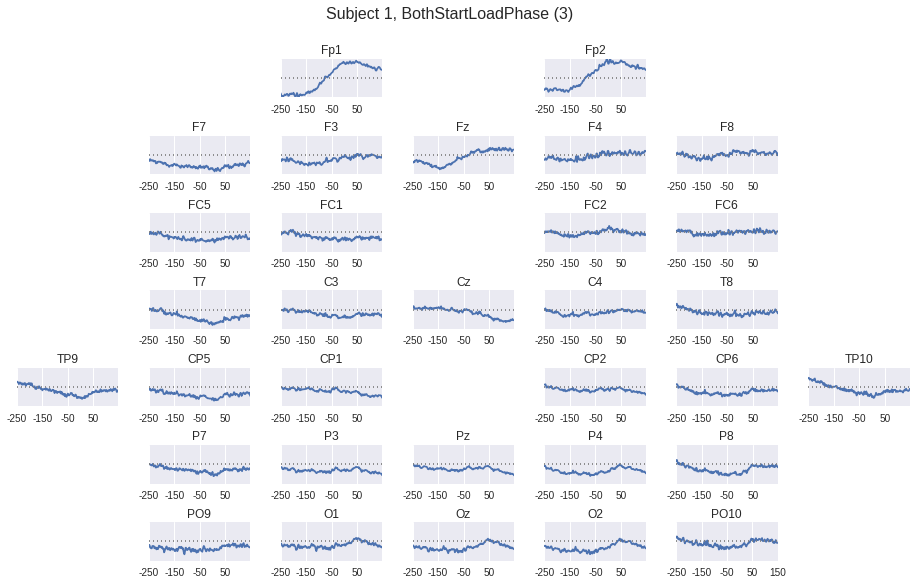

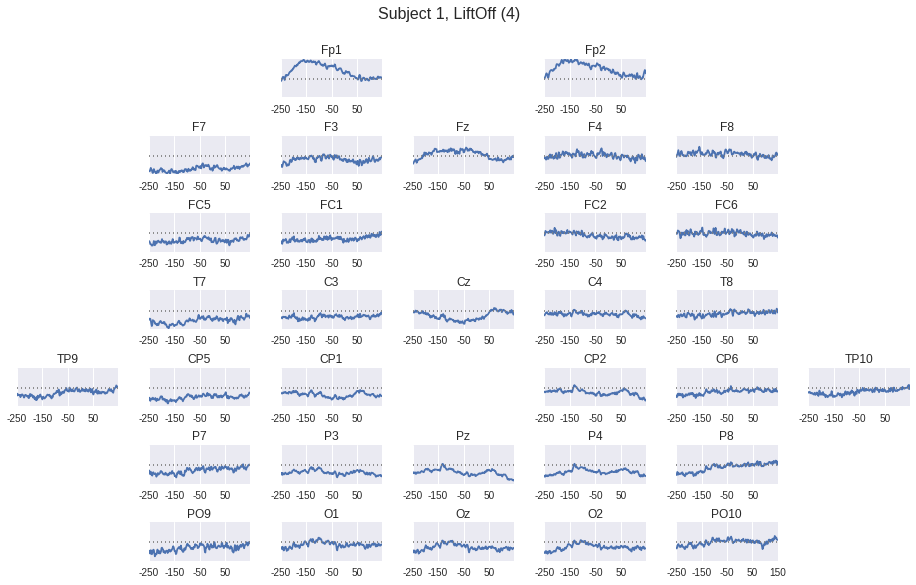

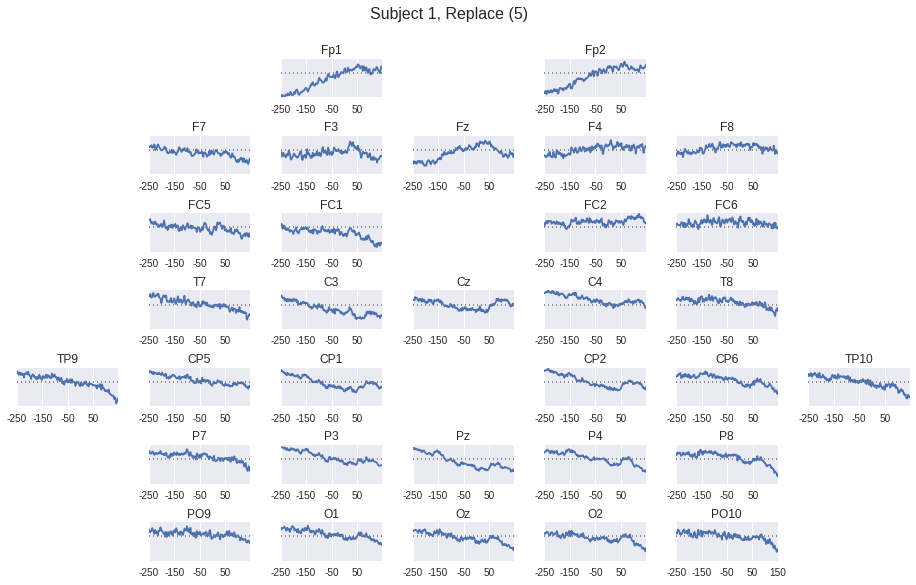

...

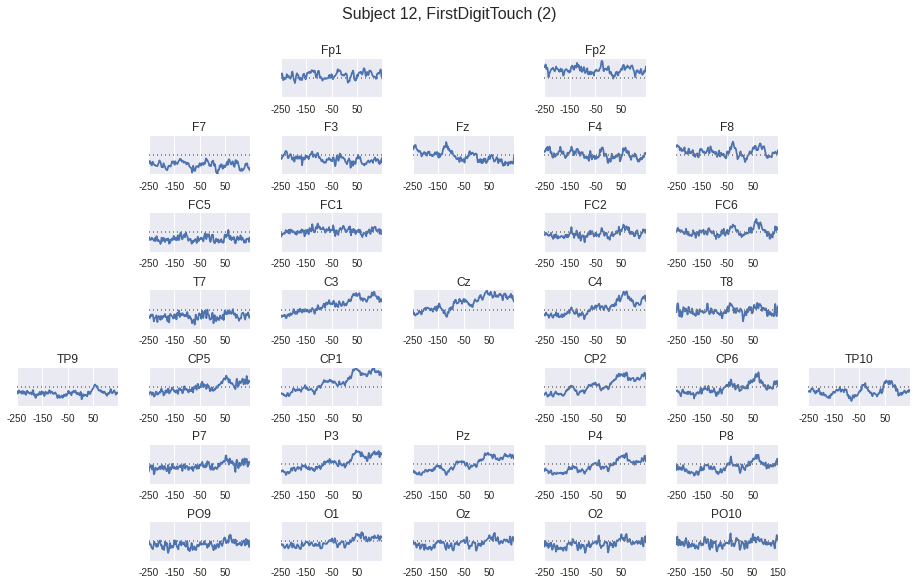

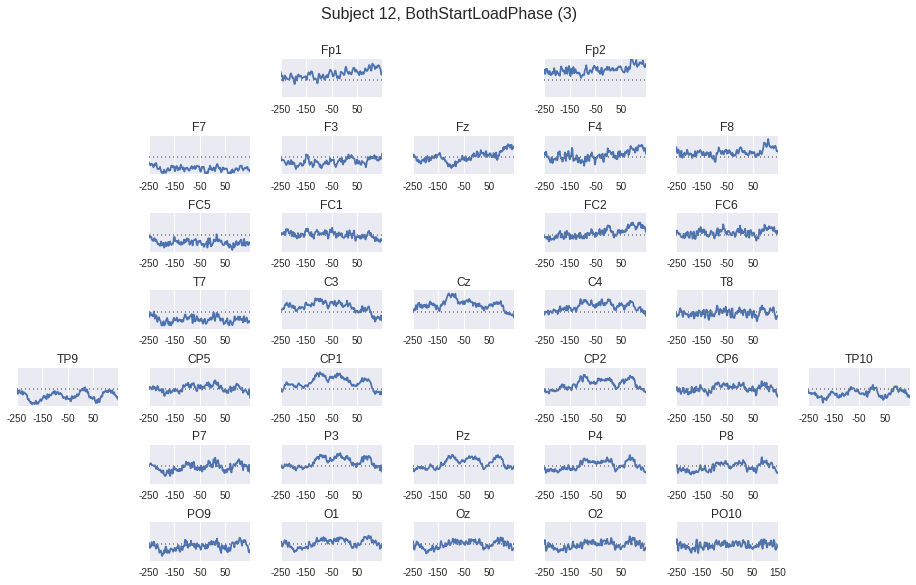

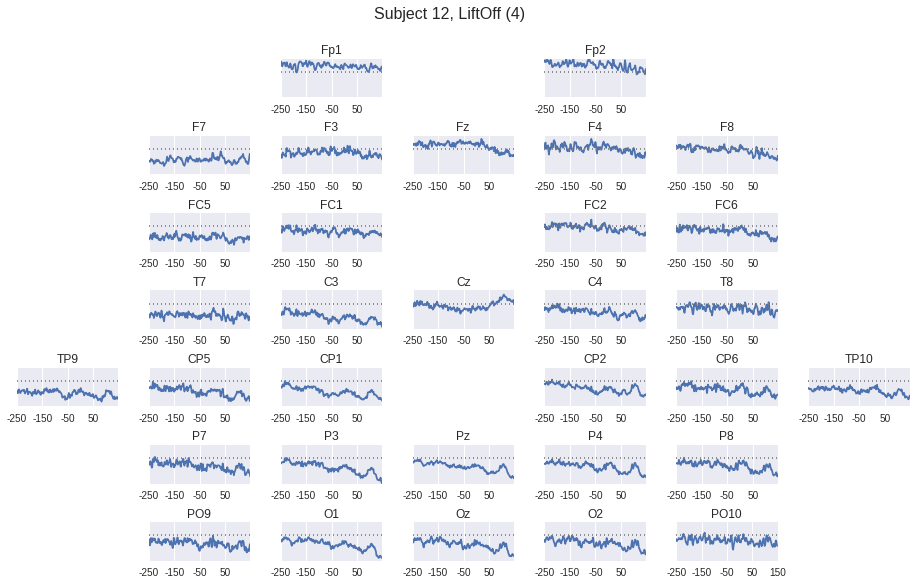

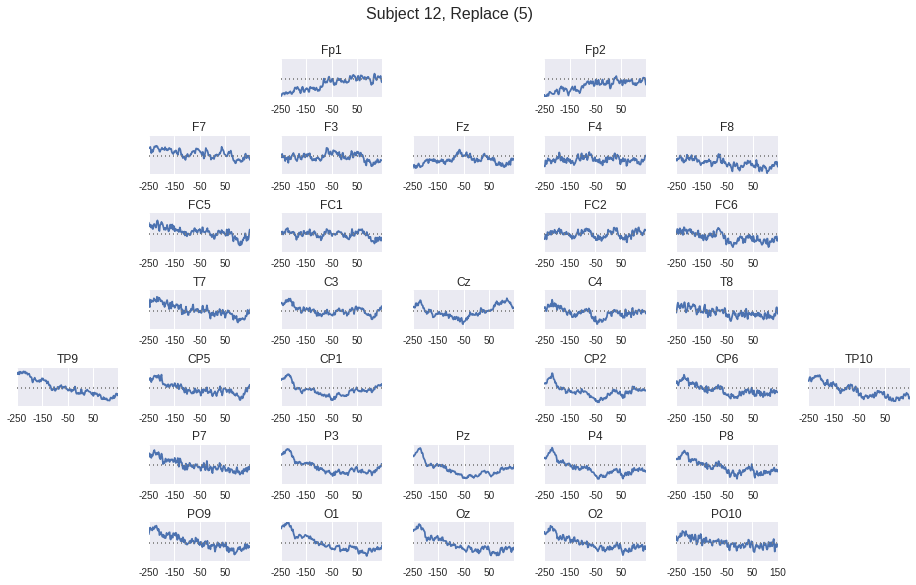

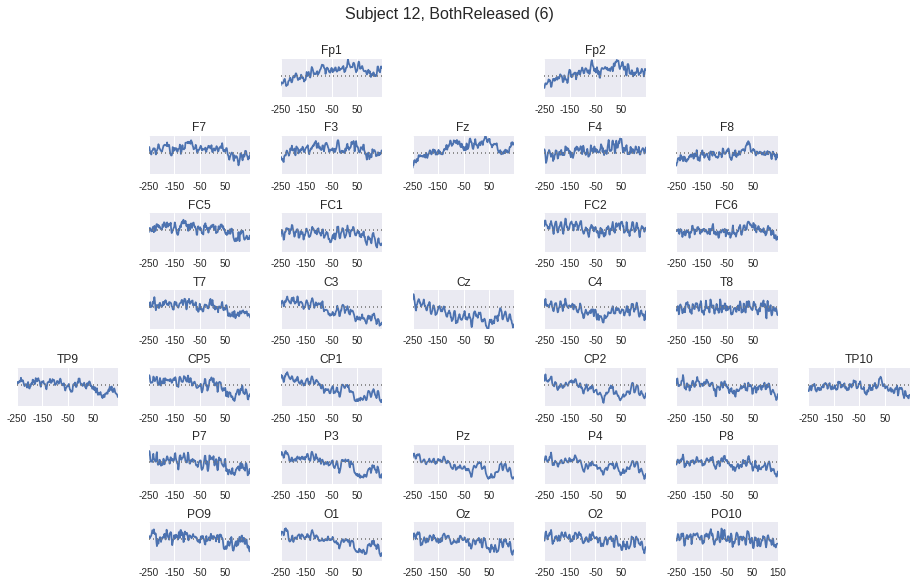

In [57]:
from braindecode.analysis.plot_util import plot_head_signals_tight
from braindecode.datasets.sensor_positions import tight_Kaggle_positions


%config InlineBackend.figure_format = 'png'

class_names = ['HandStart', 'FirstDigitTouch', 'BothStartLoadPhase',
    'LiftOff', 'Replace', 'BothReleased']

for i_subject in xrange(12):
    train_topo = np.concatenate(all_set.kaggle_sets[i_subject].train_X_series)
    train_y = np.concatenate(all_set.kaggle_sets[i_subject].train_y_series)

    for i_class in xrange(6):
        class_trials = extract_windows(train_topo,
                                       train_y,
                                       i_class, -125,75)
        trial_mean = np.mean(class_trials, axis=(0)).T
        fig = plot_head_signals_tight(trial_mean, 
                        all_set.kaggle_sets[i_subject].sensor_names,
                       sensor_map=tight_Kaggle_positions,
                                     figsize=(16,9))
        plt.xticks(range(0,201,50), range(-250,151,100))
        plt.subplots_adjust(hspace=1.0)
        plt.subplots_adjust(wspace=0.3)
        fig.suptitle("Subject {:d}, {:s} ({:d})".format(i_subject + 1, class_names[i_class],
                                                       i_class+1),
                     fontsize=16, y=0.98)

#%config InlineBackend.figure_format = 'svg'

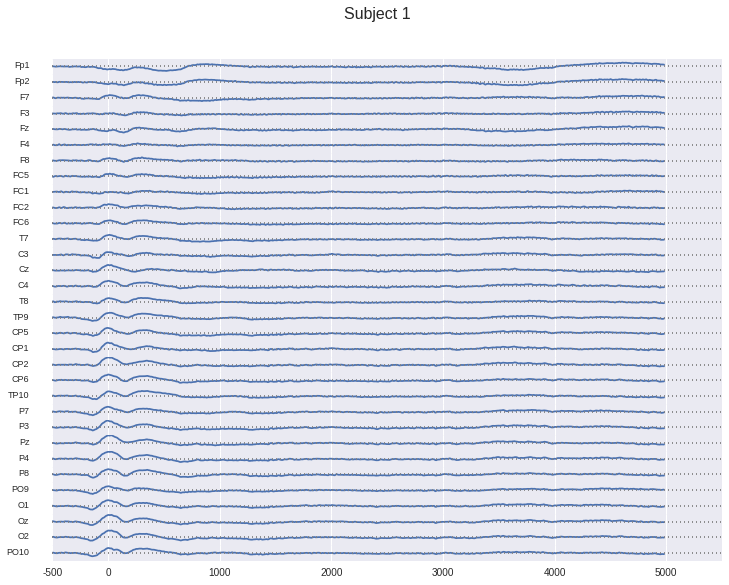

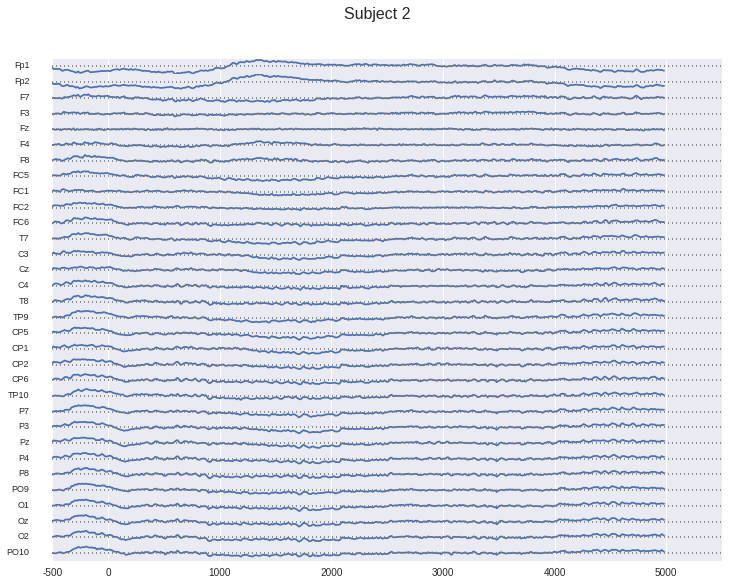

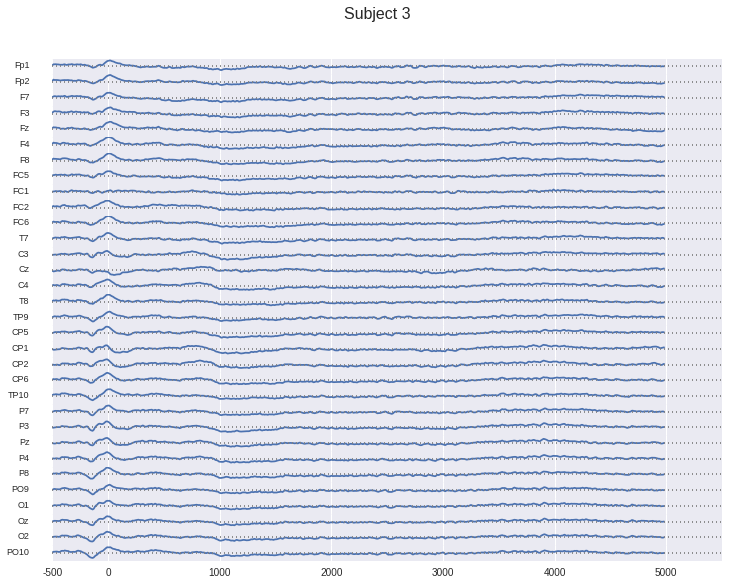

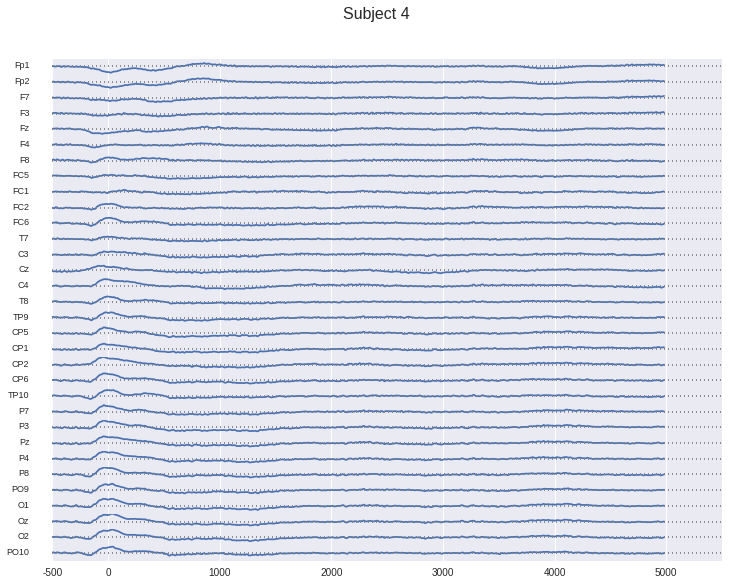

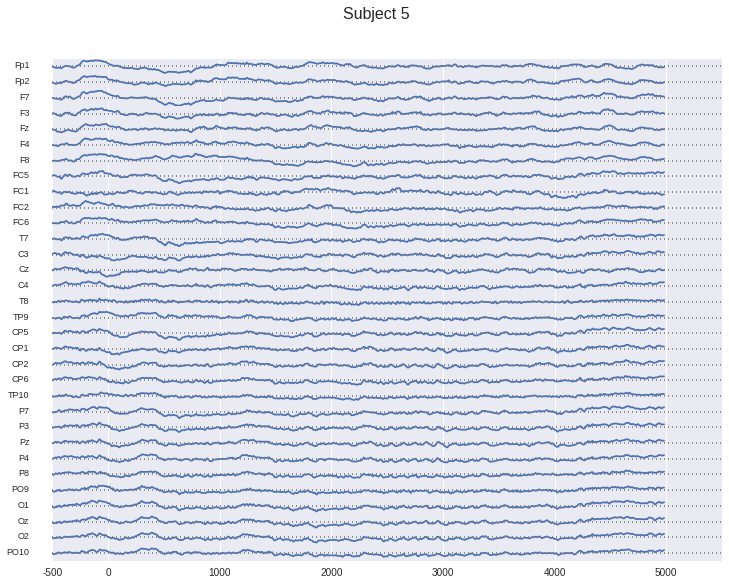

...

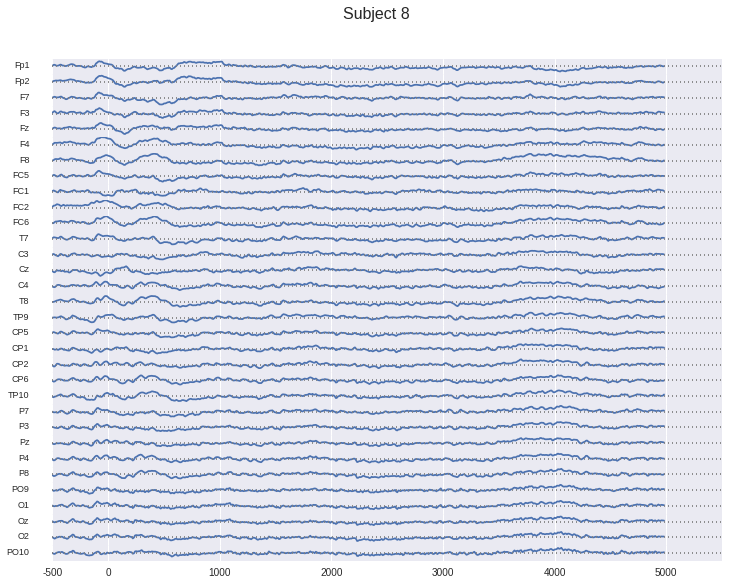

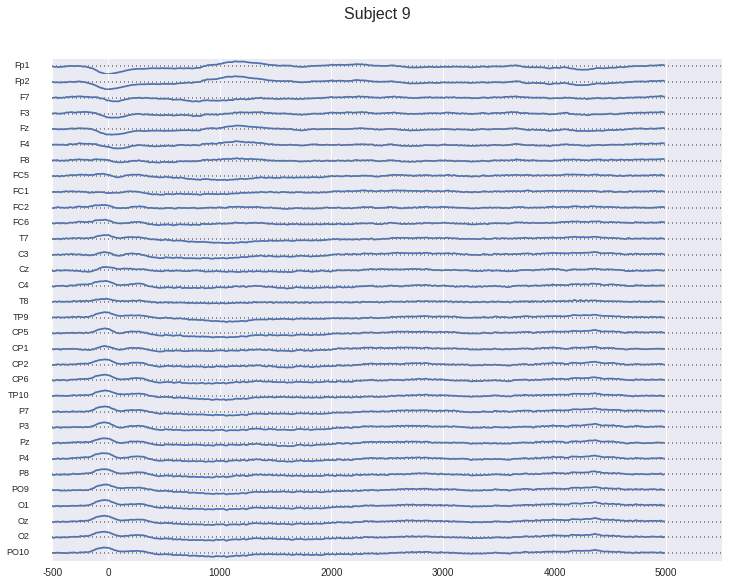

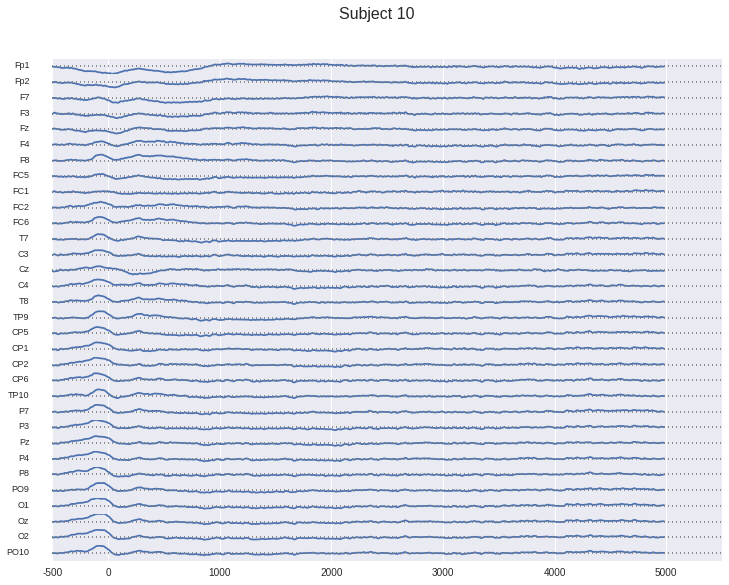

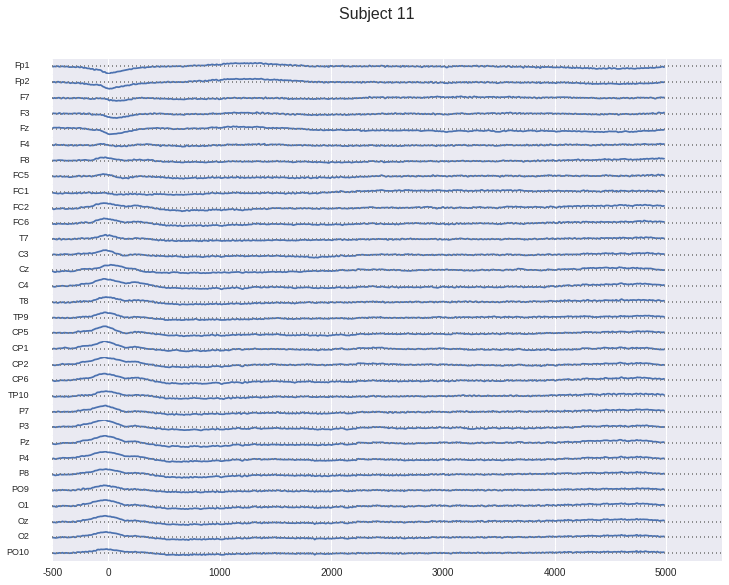

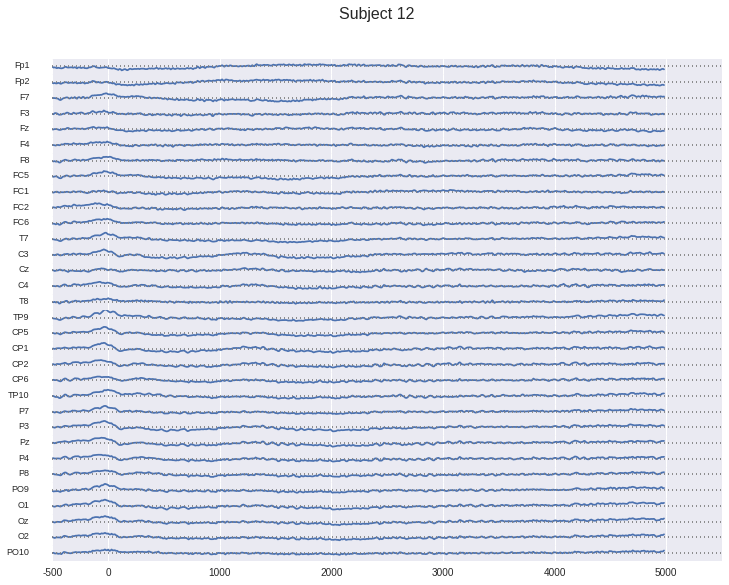

In [135]:
from braindecode.analysis.plot_util import plot_sensor_signals
for i_subject in xrange(12):
    this_sub_trials = all_subjects_trials[i_subject]
    mean_trial = np.mean(this_sub_trials, axis=(0))
    plot_trial = resample_for_plot(mean_trial, 550, 'sinc_fastest')
    fig = plot_sensor_signals(plot_trial.T, all_set.kaggle_sets[i_subject].sensor_names, figsize=(12,9))
    plt.xticks([0] + range(50,551,100), [-500] + range(0,5001,1000))
    fig.suptitle("Subject {:d}".format(i_subject + 1), fontsize=16, y=0.98)
    None

In [1]:
%%capture
import os
import site
site.addsitedir('/home/schirrmr/.local/lib/python2.7/site-packages/')
site.addsitedir('/usr/lib/pymodules/python2.7/')
os.sys.path.insert(0, '/home/schirrmr/braindecode/code/')
%cd /home/schirrmr/braindecode/code/braindecode/
assert 'THEANO_FLAGS' in os.environ
# switch to cpu
os.environ['THEANO_FLAGS'] = 'floatX=float32,device=cpu,nvcc.fastmath=True'
%load_ext autoreload
%autoreload 2